In [1]:

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/kaggle/input/house-prices-advanced-regression-techniques/sample_submission.csv
/kaggle/input/house-prices-advanced-regression-techniques/data_description.txt
/kaggle/input/house-prices-advanced-regression-techniques/train.csv
/kaggle/input/house-prices-advanced-regression-techniques/test.csv


In [2]:
# Import necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import missingno as msno
import pickle
# !pip install missingno
from datetime import date
from matplotlib import pyplot as plt
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder, RobustScaler
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier, export_graphviz, export_text
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, precision_score, recall_score
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, validation_curve
from sklearn.preprocessing import LabelEncoder
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_log_error
from xgboost import XGBRegressor
import warnings
#import joblib
#import pydotplus
#from skompiler import skompile
#import graphviz

warnings.simplefilter(action='ignore', category=Warning)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)
pd.set_option('display.expand_frame_repr', False)
pd.set_option("display.float_format", lambda x: "%.3f" % x)



# 1. Explatory Data Analysis

In [3]:
train_df=pd.read_csv("/kaggle/input/house-prices-advanced-regression-techniques/train.csv")
test_df=pd.read_csv("/kaggle/input/house-prices-advanced-regression-techniques/test.csv")

In [4]:
train_df.head()


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.000,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.000,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.000,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.000,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.000,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
test_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.000,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.000,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.000,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.000,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.000,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [6]:
df_ = pd.concat([train_df, test_df])
df=df_.copy()


In [7]:
df.shape

(2919, 81)

In [8]:
df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.000,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.000
1,2,20,RL,80.000,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.000
2,3,60,RL,68.000,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.000
3,4,70,RL,60.000,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.000
4,5,60,RL,84.000,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.000
5,6,50,RL,85.000,14115,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000.000
6,7,20,RL,75.000,10084,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000.000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000.000
8,9,50,RM,51.000,6120,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900.000
9,10,190,RL,50.000,7420,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2008,WD,Normal,118000.000


In [9]:
def check_df(dataframe, head=5):
    print("##################### Shape #####################""\n\n")
    print(dataframe.shape)
    print("*****************************************\n")

    print("##################### Types #####################""\n\n")
    print("*****************************************\n")
    print(dataframe.dtypes)
    print("*****************************************\n")
    print("##################### Head #####################""\n\n")
    print("*****************************************\n")
    print(dataframe.head(head))
    print("*****************************************\n")
    print("##################### Tail #####################""\n\n")
    print("*****************************************\n")
    print(dataframe.tail(head))
    print("*****************************************\n")
    print("##################### NA #####################""\n\n")
    print(dataframe.isnull().sum())
    print("*****************************************\n")
    print("##################### Descriptive Statistics #####################""\n\n")
    print("*****************************************\n")
    print(dataframe.describe())


check_df(df)

##################### Shape #####################


(2919, 81)
*****************************************

##################### Types #####################


*****************************************

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object

## 1.1. Defining Future Types

In [10]:
def grab_col_names(dataframe, cat_th=10, car_th=20):
    """
    Returns the names of categorical, numerical, and categorical but cardinal variables in the dataset.
    Note: Numerical-looking categorical variables are also included in categorical variables.

    Parameters
    ------
        dataframe: dataframe
            The dataframe from which variable names are to be taken.
        cat_th: int, optional
            Class threshold value for numerical but categorical variables.
        car_th: int, optional
            Class threshold value for categorical but cardinal variables.
    Returns
    ------
        cat_cols: list
            List of categorical variables.
        num_cols: list
            List of numerical variables.
        cat_but_car: list
            List of categorical but cardinal variables.

    Examples
    ------
        import seaborn as sns
        df = sns.load_dataset("iris")
        print(grab_col_names(df))
    Notes
    ------
        cat_cols + num_cols + cat_but_car = total number of variables
        num_but_cat is included in cat_cols.
        The sum of the 3 lists returned is equal to the total number of variables: cat_cols + num_cols + cat_but_car = total number of variables
    """
    # cat_cols, cat_but_car
    # Categorical variables
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    # Numerical-looking categorical variables
    num_but_cat = [col for col in dataframe.columns if
                   dataframe[col].nunique() < cat_th and dataframe[col].dtypes != "O"]
    # Categorical but cardinal variables
    cat_but_car = [col for col in dataframe.columns if
                   dataframe[col].nunique() > car_th and dataframe[col].dtypes == "O"]
    cat_cols = cat_cols + num_but_cat  # Update categorical variables by adding numerical-looking categorical variables
    cat_cols = [col for col in cat_cols if
                col not in cat_but_car]  # Exclude categorical but cardinal variables to get final cat_cols
    # num_cols
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]  # Get non-object type variables
    num_cols = [col for col in num_cols if
                col not in num_but_cat]  # Exclude numerical-looking categorical variables
    
    print(f"Observations: {dataframe.shape[0]}")
    print("*****************************************\n")
    print(f"Number of Variables[(1)+(2)+(3)]: {dataframe.shape[1]}")
    print("*****************************************\n")
    print(f"----->(1):Number of Categorical Variables: {len(cat_cols)}")
    print("*****************************************\n")
    print(f"        ----->(Number of Numerical-type_but Categorical Variables): {len(num_but_cat)}")
    print("*****************************************\n")
    print(f"----->(2):Number of Numerical Variables: {len(num_cols)}")
    print("*****************************************\n")
    print(f"----->(3):Number of Cardinal Variables: {len(cat_but_car)}")
    print("****************************************************************")
    print(f"Categorical Variables: {cat_cols}")
    print("*****************************************\n")
    print(f"----->Numerical-type_but Categorical Variables: {num_but_cat}")
    print("*****************************************\n")
    print(f"Numerical Variables: {num_cols}")
    print("*****************************************\n")
    print(f"Cardinal Variables: {cat_but_car}")
    
    return cat_cols, num_cols, cat_but_car


cat_cols, num_cols, cat_but_car = grab_col_names(df)


Observations: 2919
*****************************************

Number of Variables[(1)+(2)+(3)]: 81
*****************************************

----->(1):Number of Categorical Variables: 52
*****************************************

        ----->(Number of Numerical-type_but Categorical Variables): 10
*****************************************

----->(2):Number of Numerical Variables: 28
*****************************************

----->(3):Number of Cardinal Variables: 1
****************************************************************
Categorical Variables: ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageTy

## 1.2. Analysis of the Categorical Variables 

          MSZoning  Ratio
MSZoning                 
RL            2265 77.595
RM             460 15.759
FV             139  4.762
RH              26  0.891
C (all)         25  0.856
##########################################


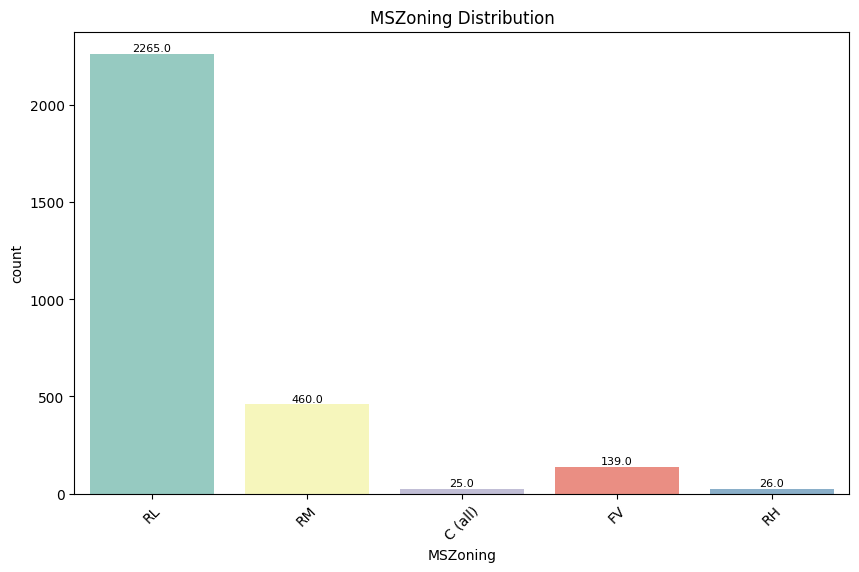

        Street  Ratio
Street               
Pave      2907 99.589
Grvl        12  0.411
##########################################


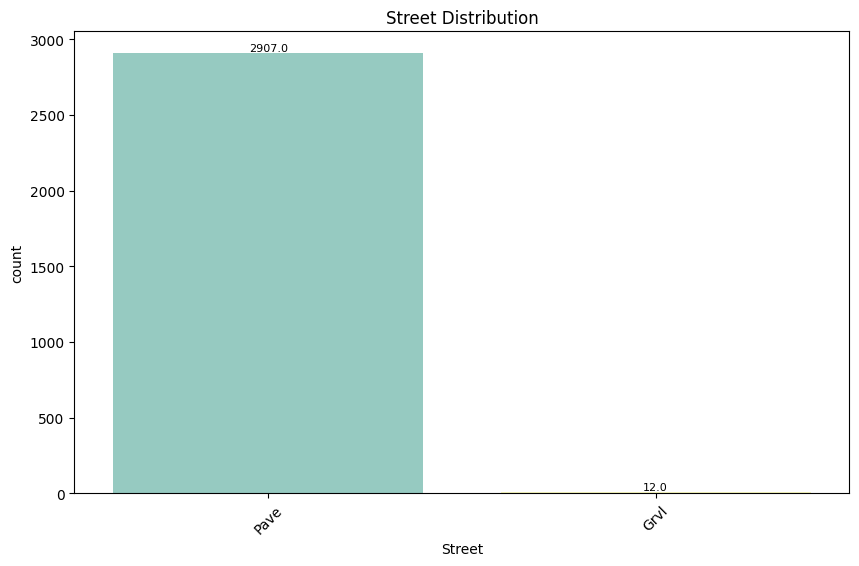

       Alley  Ratio
Alley              
Grvl     120  4.111
Pave      78  2.672
##########################################


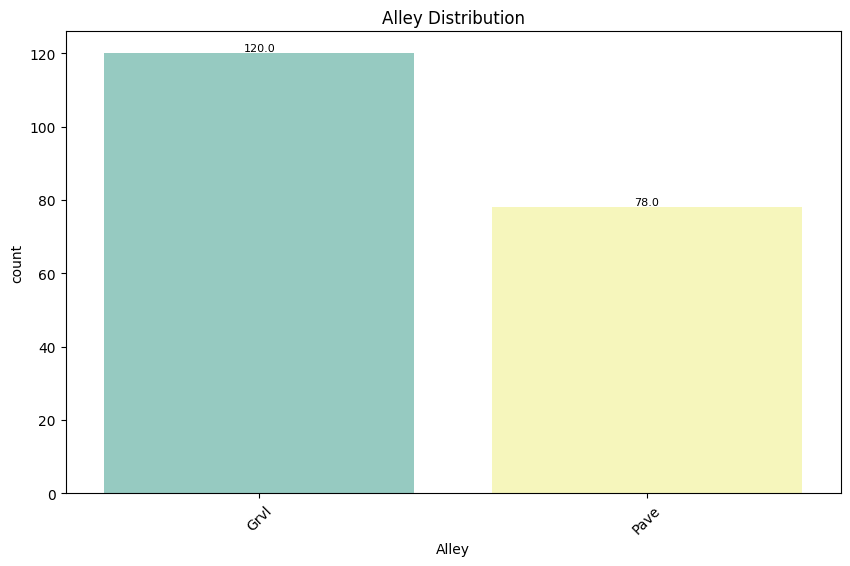

          LotShape  Ratio
LotShape                 
Reg           1859 63.686
IR1            968 33.162
IR2             76  2.604
IR3             16  0.548
##########################################


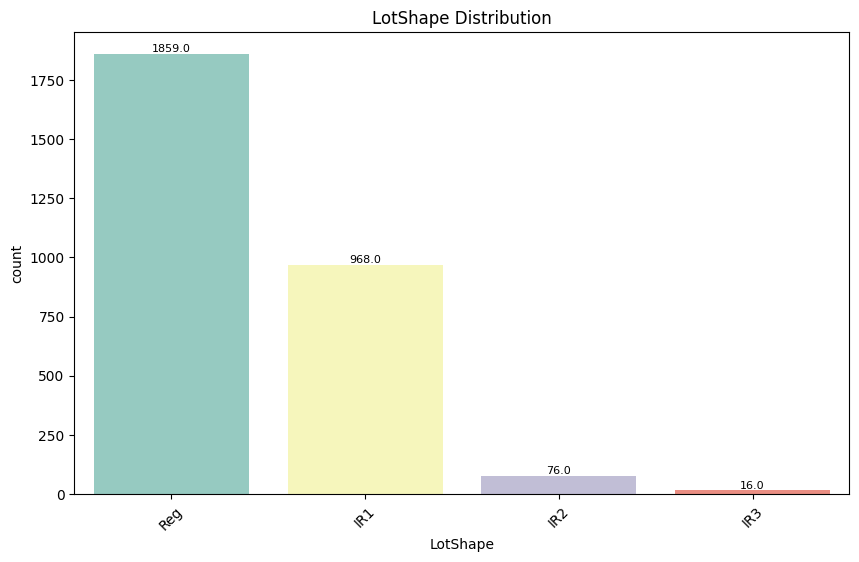

             LandContour  Ratio
LandContour                    
Lvl                 2622 89.825
HLS                  120  4.111
Bnk                  117  4.008
Low                   60  2.055
##########################################


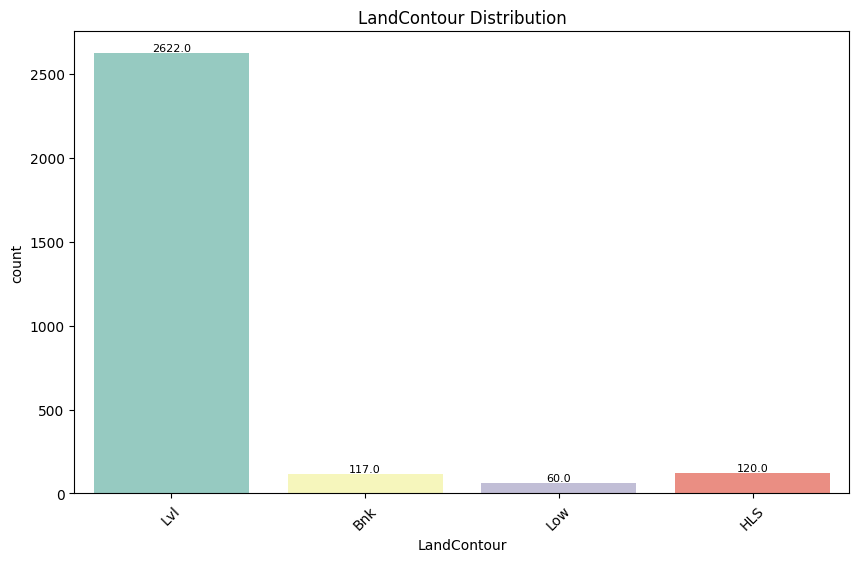

           Utilities  Ratio
Utilities                  
AllPub          2916 99.897
NoSeWa             1  0.034
##########################################


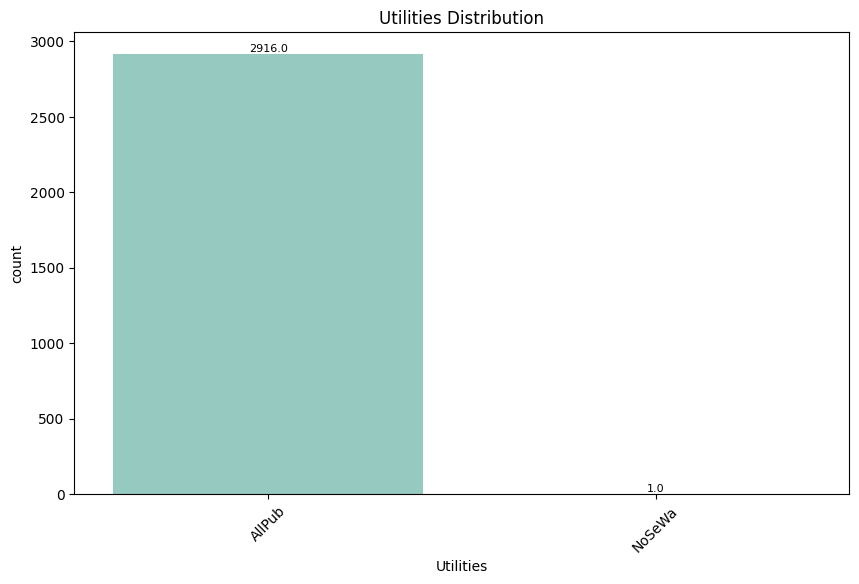

           LotConfig  Ratio
LotConfig                  
Inside          2133 73.073
Corner           511 17.506
CulDSac          176  6.029
FR2               85  2.912
FR3               14  0.480
##########################################


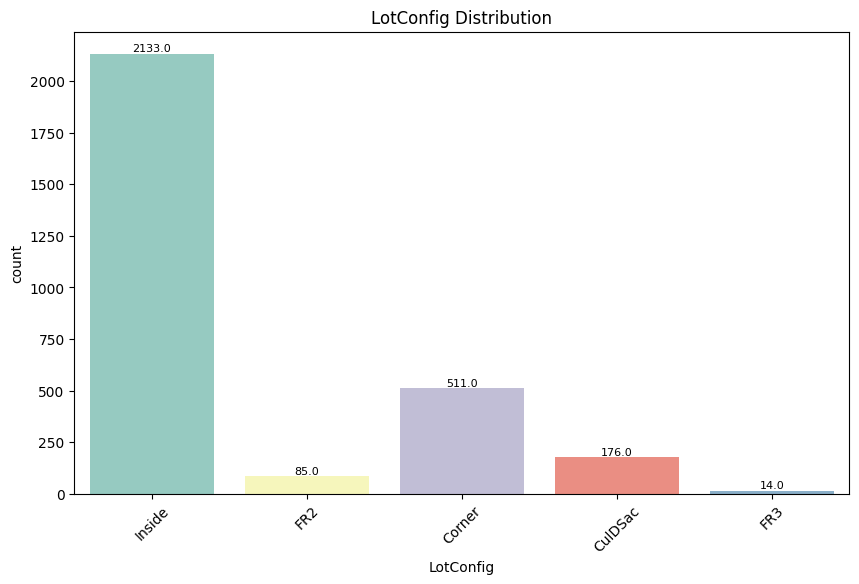

           LandSlope  Ratio
LandSlope                  
Gtl             2778 95.170
Mod              125  4.282
Sev               16  0.548
##########################################


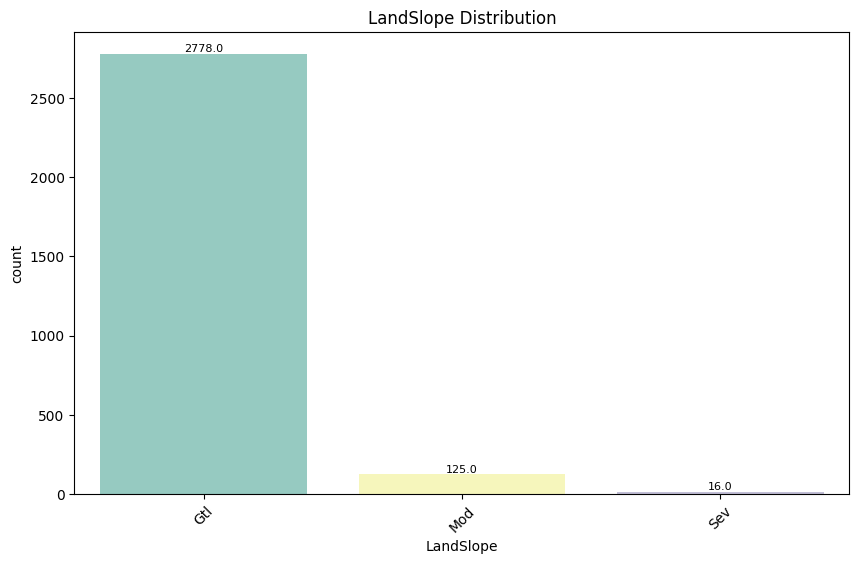

            Condition1  Ratio
Condition1                   
Norm              2511 86.023
Feedr              164  5.618
Artery              92  3.152
RRAn                50  1.713
PosN                39  1.336
RRAe                28  0.959
PosA                20  0.685
RRNn                 9  0.308
RRNe                 6  0.206
##########################################


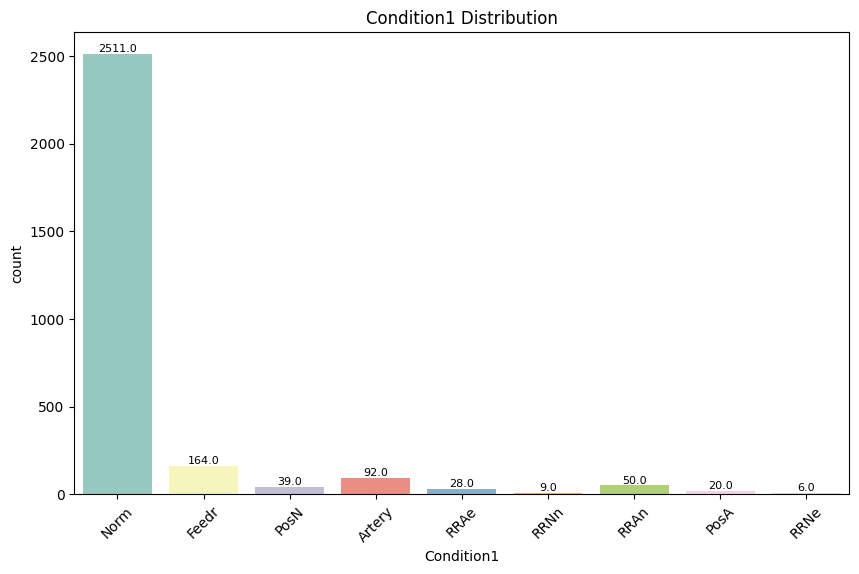

            Condition2  Ratio
Condition2                   
Norm              2889 98.972
Feedr               13  0.445
Artery               5  0.171
PosN                 4  0.137
PosA                 4  0.137
RRNn                 2  0.069
RRAn                 1  0.034
RRAe                 1  0.034
##########################################


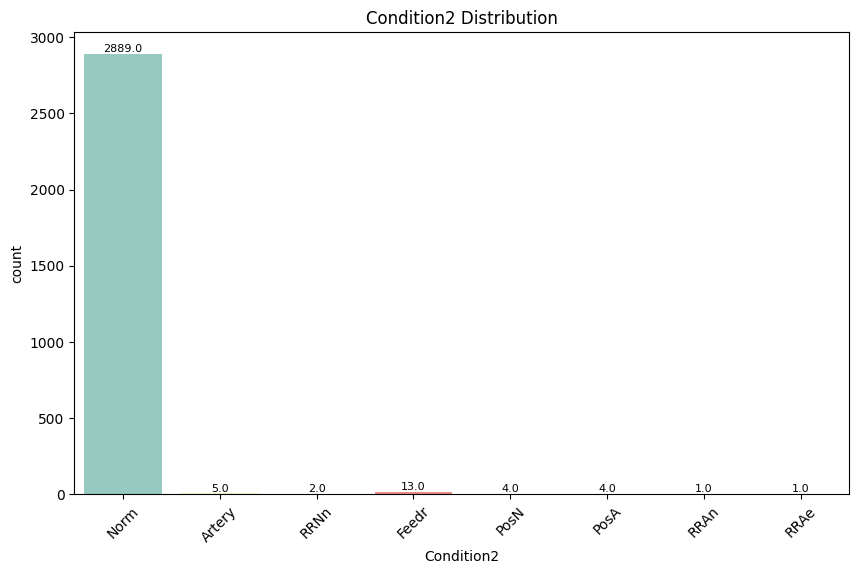

          BldgType  Ratio
BldgType                 
1Fam          2425 83.076
TwnhsE         227  7.777
Duplex         109  3.734
Twnhs           96  3.289
2fmCon          62  2.124
##########################################


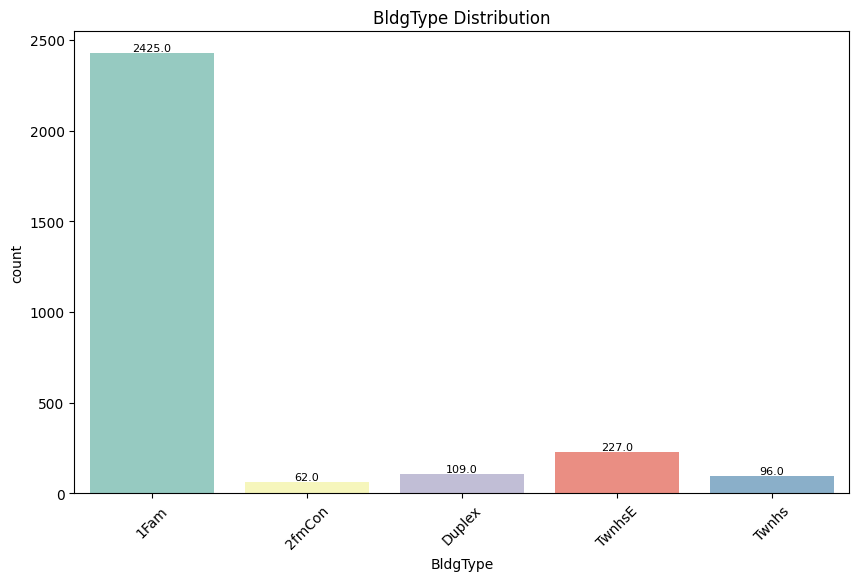

            HouseStyle  Ratio
HouseStyle                   
1Story            1471 50.394
2Story             872 29.873
1.5Fin             314 10.757
SLvl               128  4.385
SFoyer              83  2.843
2.5Unf              24  0.822
1.5Unf              19  0.651
2.5Fin               8  0.274
##########################################


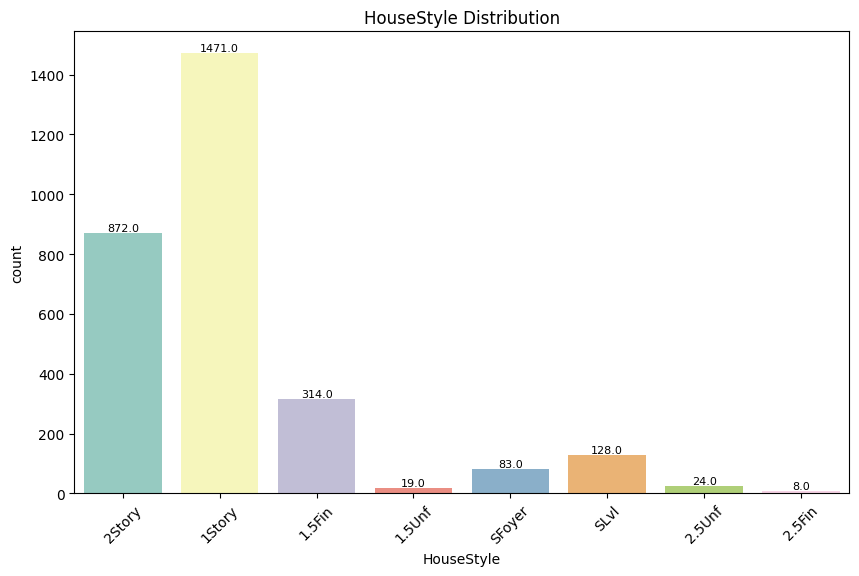

           RoofStyle  Ratio
RoofStyle                  
Gable           2310 79.137
Hip              551 18.876
Gambrel           22  0.754
Flat              20  0.685
Mansard           11  0.377
Shed               5  0.171
##########################################


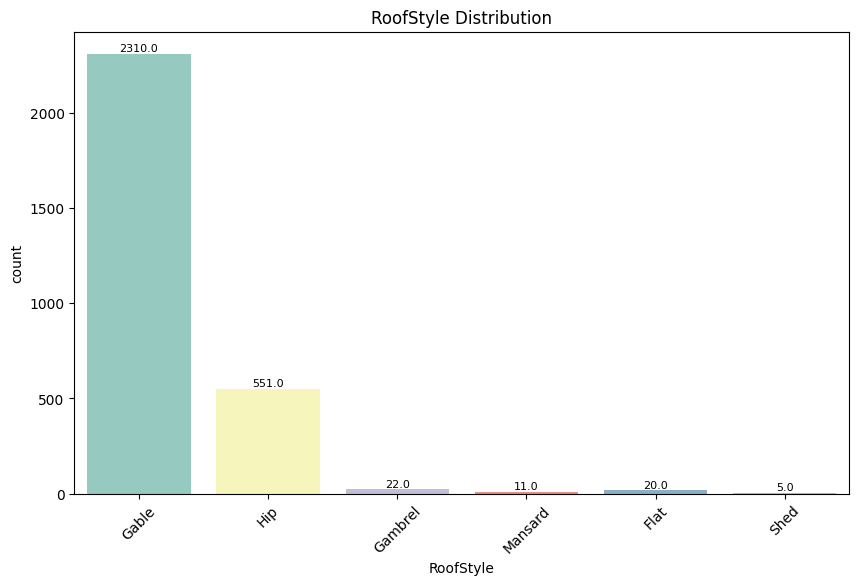

          RoofMatl  Ratio
RoofMatl                 
CompShg       2876 98.527
Tar&Grv         23  0.788
WdShake          9  0.308
WdShngl          7  0.240
Metal            1  0.034
Membran          1  0.034
Roll             1  0.034
ClyTile          1  0.034
##########################################


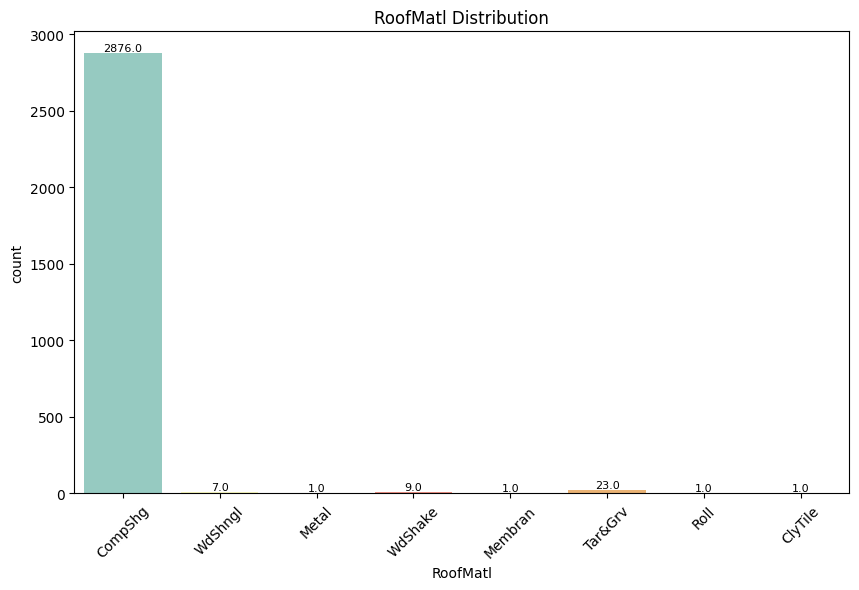

             Exterior1st  Ratio
Exterior1st                    
VinylSd             1025 35.115
MetalSd              450 15.416
HdBoard              442 15.142
Wd Sdng              411 14.080
Plywood              221  7.571
CemntBd              126  4.317
BrkFace               87  2.980
WdShing               56  1.918
AsbShng               44  1.507
Stucco                43  1.473
BrkComm                6  0.206
AsphShn                2  0.069
Stone                  2  0.069
CBlock                 2  0.069
ImStucc                1  0.034
##########################################


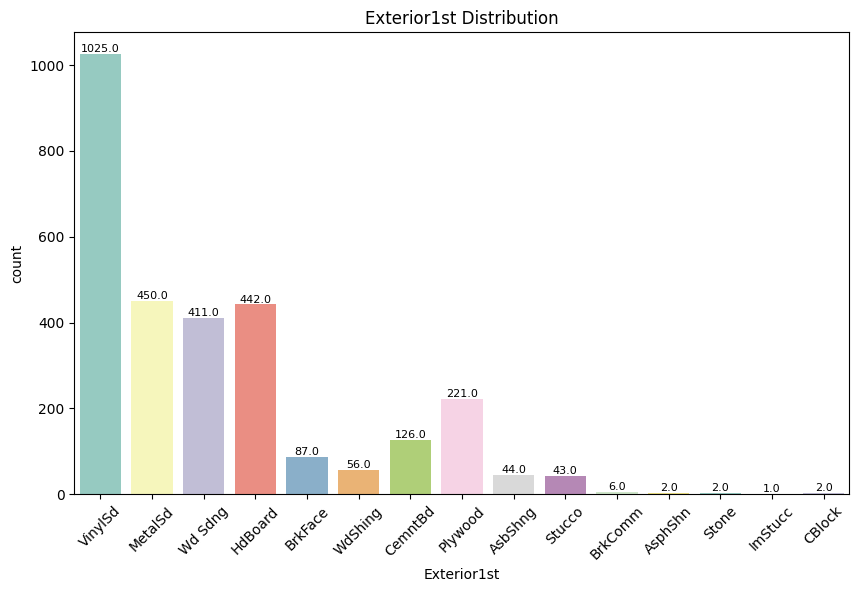

             Exterior2nd  Ratio
Exterior2nd                    
VinylSd             1014 34.738
MetalSd              447 15.313
HdBoard              406 13.909
Wd Sdng              391 13.395
Plywood              270  9.250
CmentBd              126  4.317
Wd Shng               81  2.775
BrkFace               47  1.610
Stucco                47  1.610
AsbShng               38  1.302
Brk Cmn               22  0.754
ImStucc               15  0.514
Stone                  6  0.206
AsphShn                4  0.137
CBlock                 3  0.103
Other                  1  0.034
##########################################


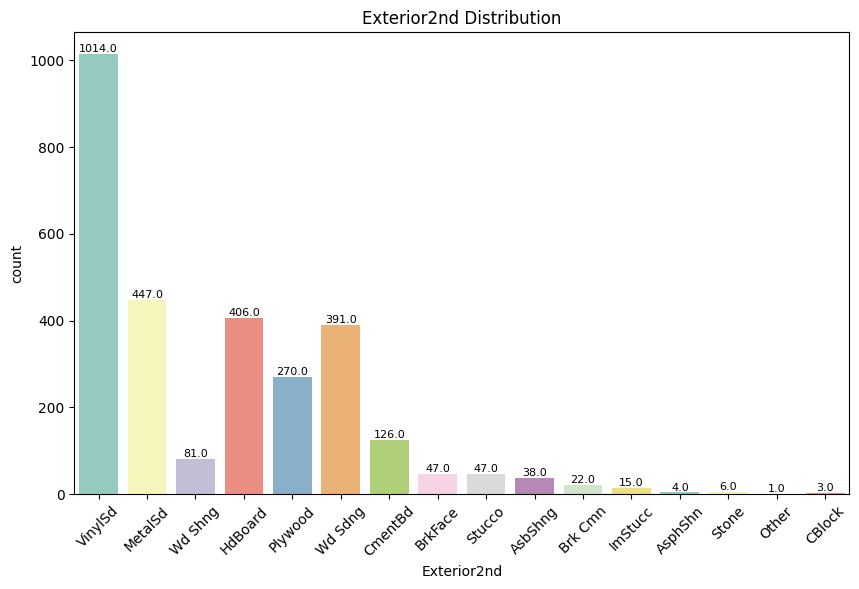

            MasVnrType  Ratio
MasVnrType                   
BrkFace            879 30.113
Stone              249  8.530
BrkCmn              25  0.856
##########################################


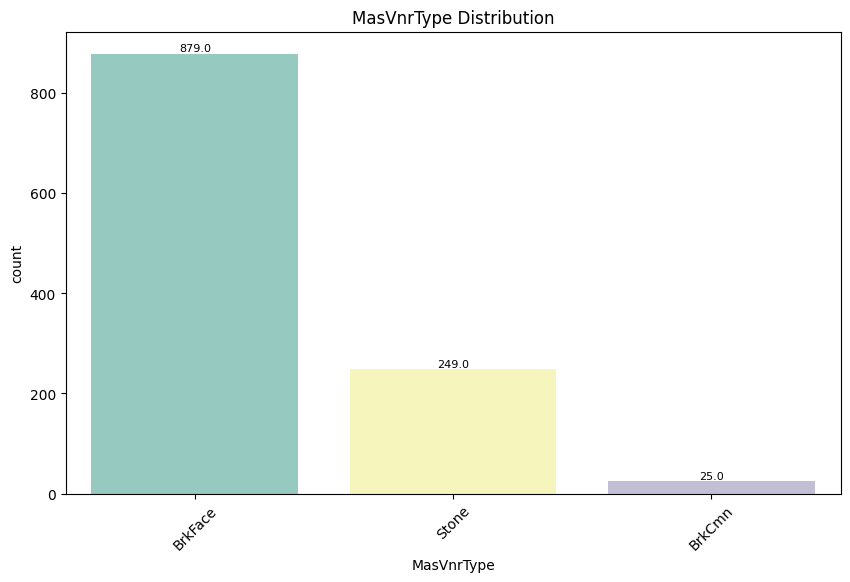

           ExterQual  Ratio
ExterQual                  
TA              1798 61.596
Gd               979 33.539
Ex               107  3.666
Fa                35  1.199
##########################################


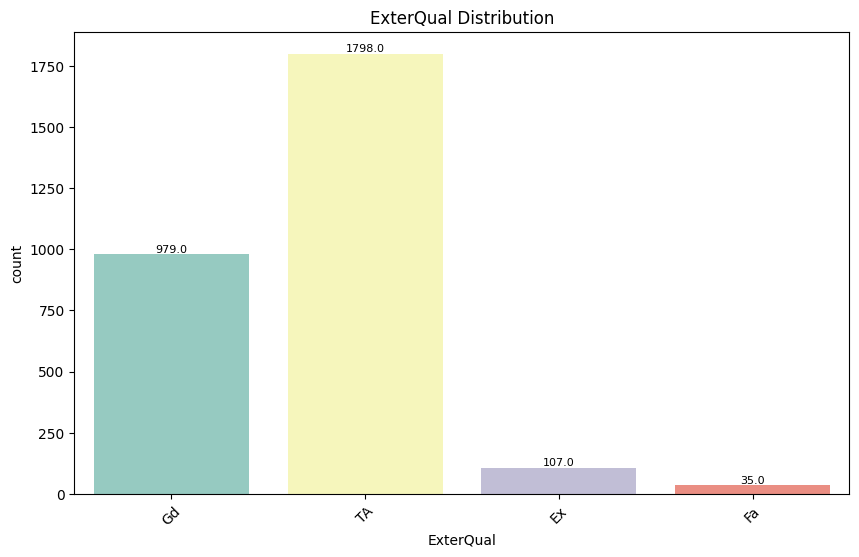

           ExterCond  Ratio
ExterCond                  
TA              2538 86.948
Gd               299 10.243
Fa                67  2.295
Ex                12  0.411
Po                 3  0.103
##########################################


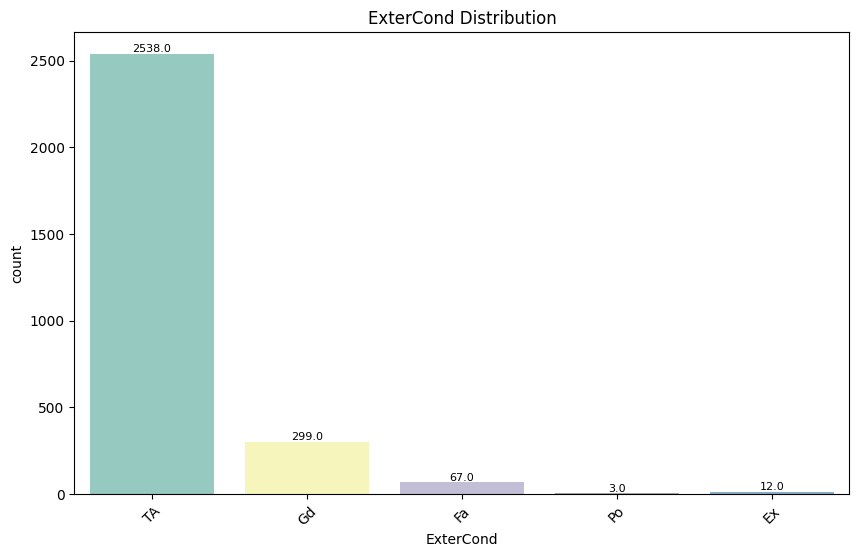

            Foundation  Ratio
Foundation                   
PConc             1308 44.810
CBlock            1235 42.309
BrkTil             311 10.654
Slab                49  1.679
Stone               11  0.377
Wood                 5  0.171
##########################################


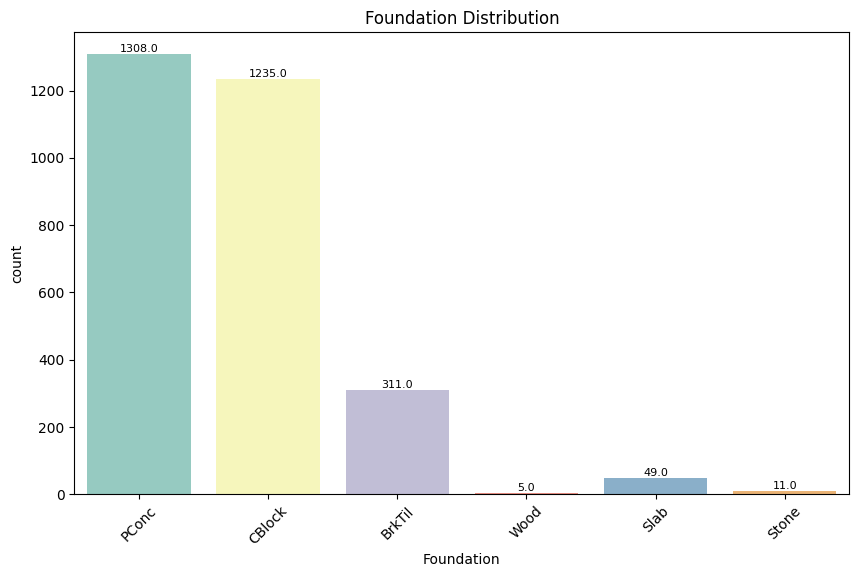

          BsmtQual  Ratio
BsmtQual                 
TA            1283 43.953
Gd            1209 41.418
Ex             258  8.839
Fa              88  3.015
##########################################


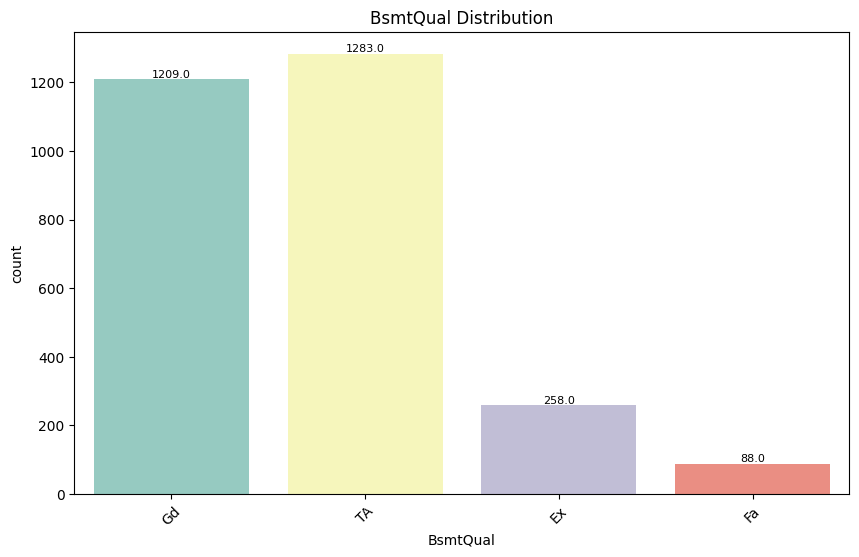

          BsmtCond  Ratio
BsmtCond                 
TA            2606 89.277
Gd             122  4.180
Fa             104  3.563
Po               5  0.171
##########################################


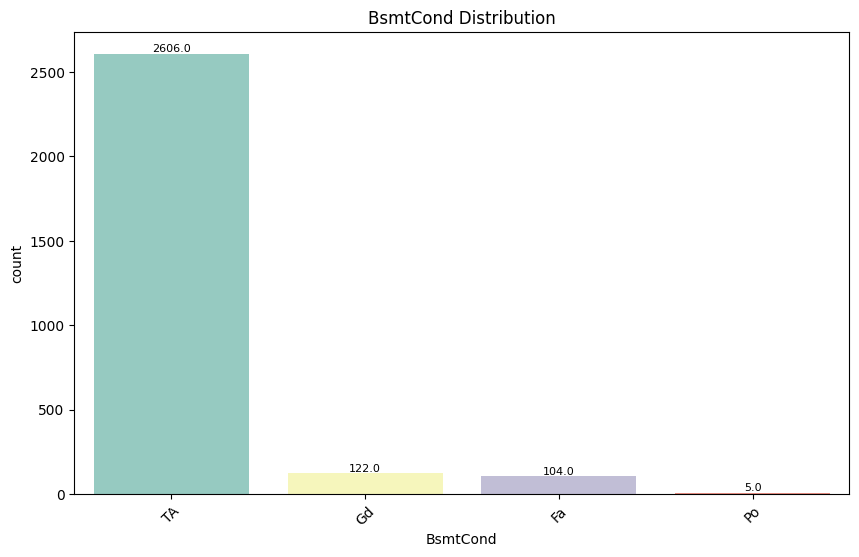

              BsmtExposure  Ratio
BsmtExposure                     
No                    1904 65.228
Av                     418 14.320
Gd                     276  9.455
Mn                     239  8.188
##########################################


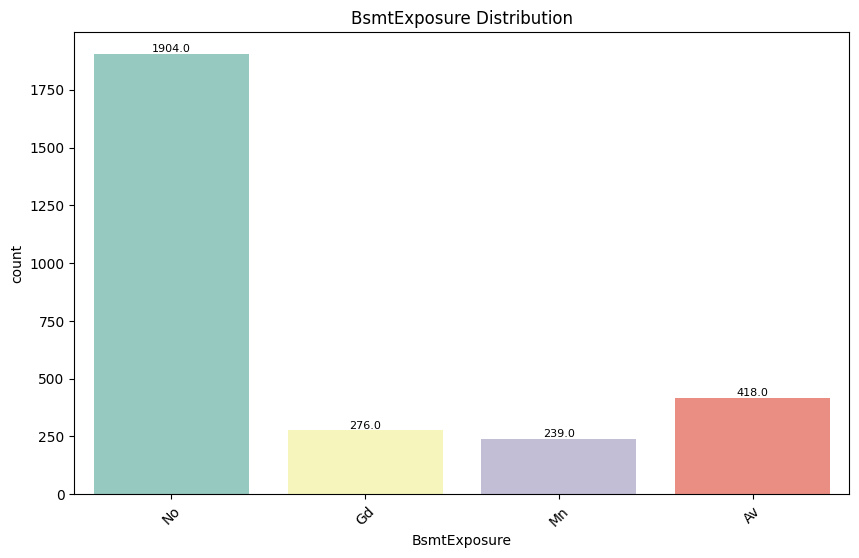

              BsmtFinType1  Ratio
BsmtFinType1                     
Unf                    851 29.154
GLQ                    849 29.085
ALQ                    429 14.697
Rec                    288  9.866
BLQ                    269  9.215
LwQ                    154  5.276
##########################################


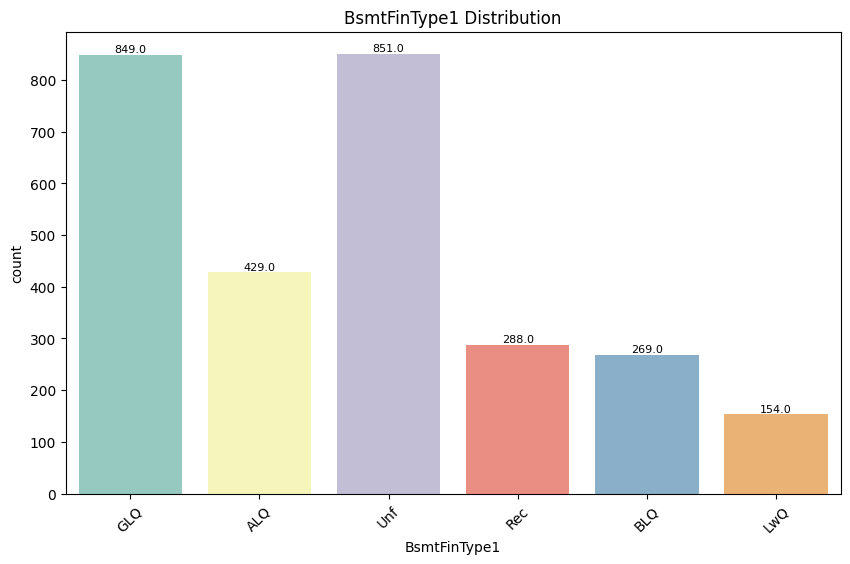

              BsmtFinType2  Ratio
BsmtFinType2                     
Unf                   2493 85.406
Rec                    105  3.597
LwQ                     87  2.980
BLQ                     68  2.330
ALQ                     52  1.781
GLQ                     34  1.165
##########################################


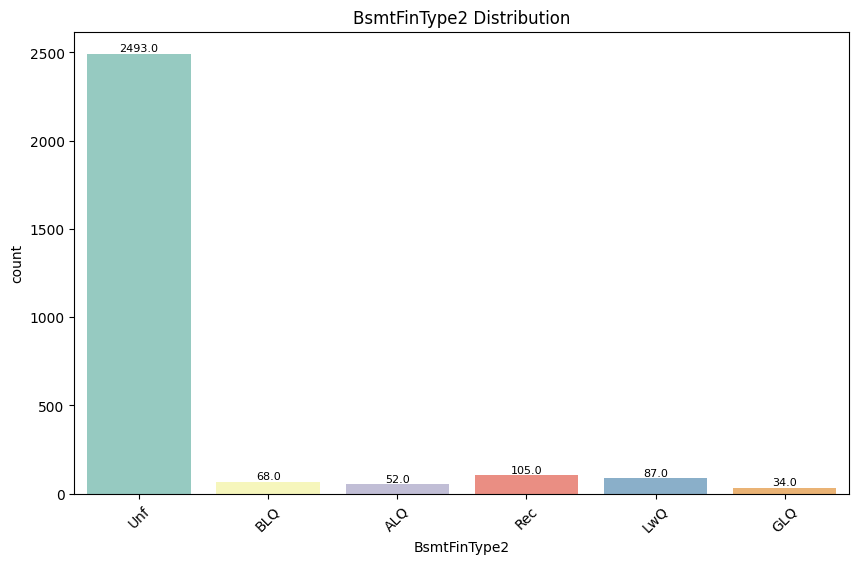

         Heating  Ratio
Heating                
GasA        2874 98.458
GasW          27  0.925
Grav           9  0.308
Wall           6  0.206
OthW           2  0.069
Floor          1  0.034
##########################################


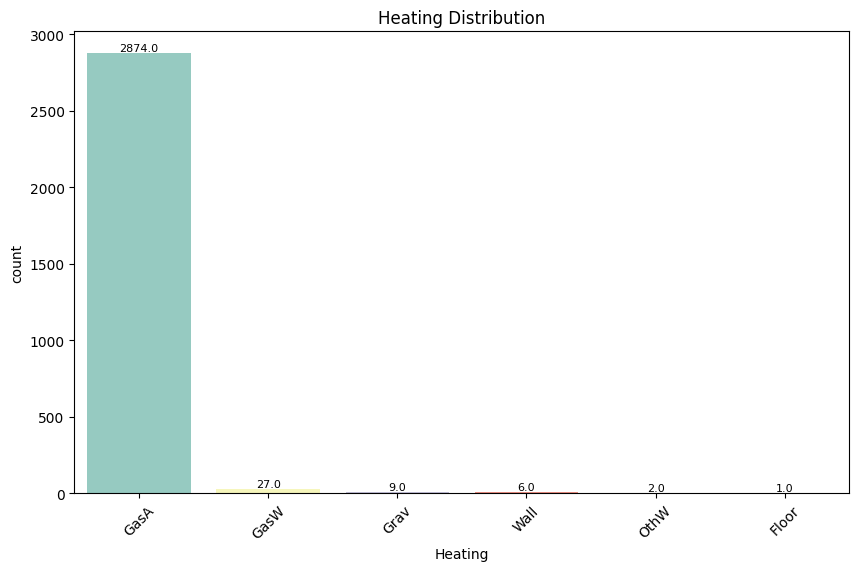

           HeatingQC  Ratio
HeatingQC                  
Ex              1493 51.148
TA               857 29.359
Gd               474 16.238
Fa                92  3.152
Po                 3  0.103
##########################################


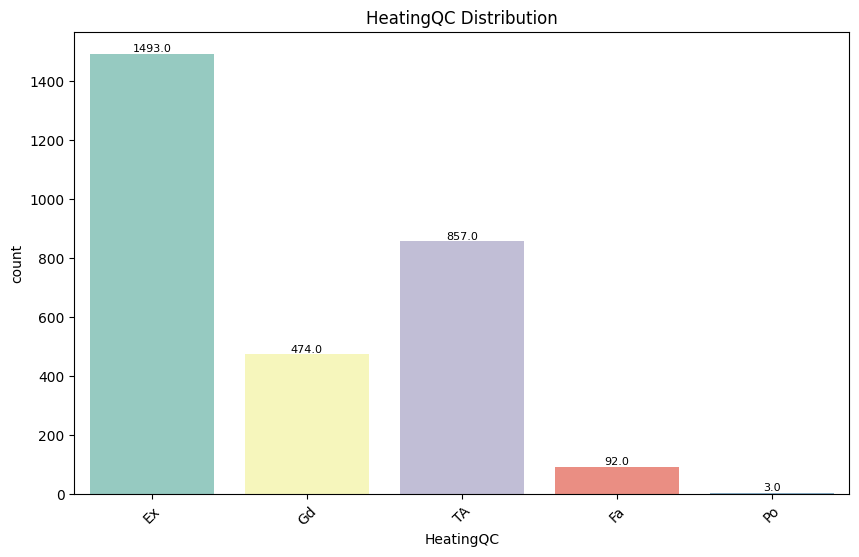

            CentralAir  Ratio
CentralAir                   
Y                 2723 93.285
N                  196  6.715
##########################################


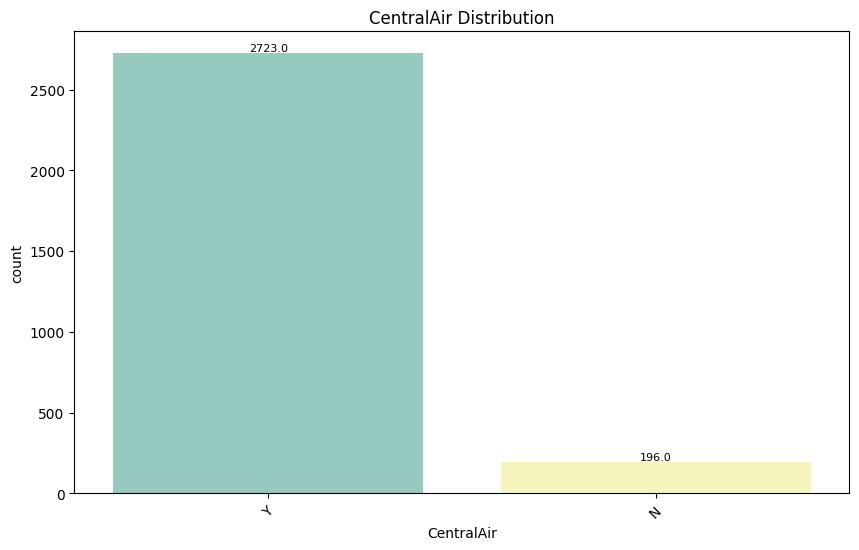

            Electrical  Ratio
Electrical                   
SBrkr             2671 91.504
FuseA              188  6.441
FuseF               50  1.713
FuseP                8  0.274
Mix                  1  0.034
##########################################


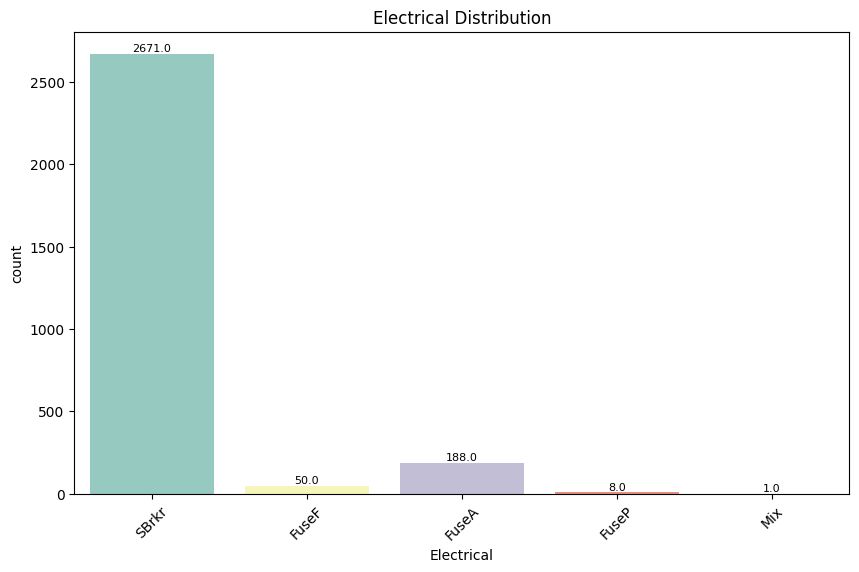

             KitchenQual  Ratio
KitchenQual                    
TA                  1492 51.113
Gd                  1151 39.431
Ex                   205  7.023
Fa                    70  2.398
##########################################


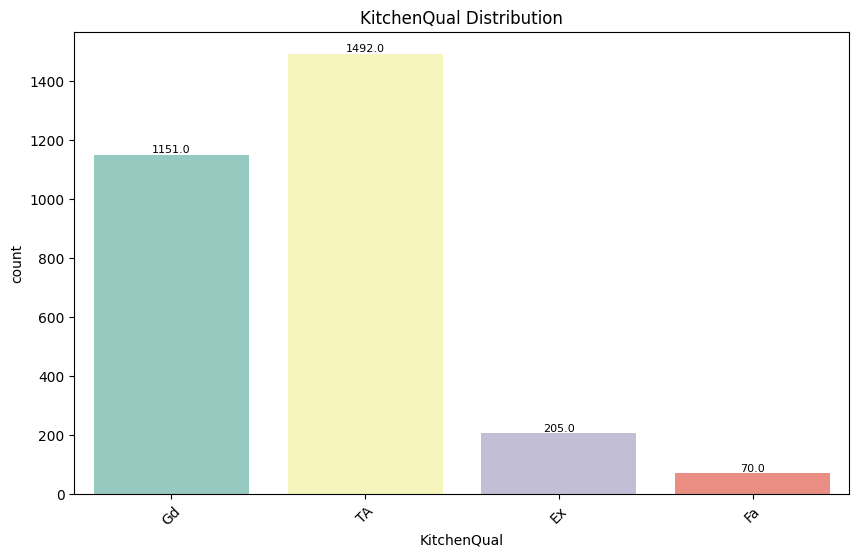

            Functional  Ratio
Functional                   
Typ               2717 93.080
Min2                70  2.398
Min1                65  2.227
Mod                 35  1.199
Maj1                19  0.651
Maj2                 9  0.308
Sev                  2  0.069
##########################################


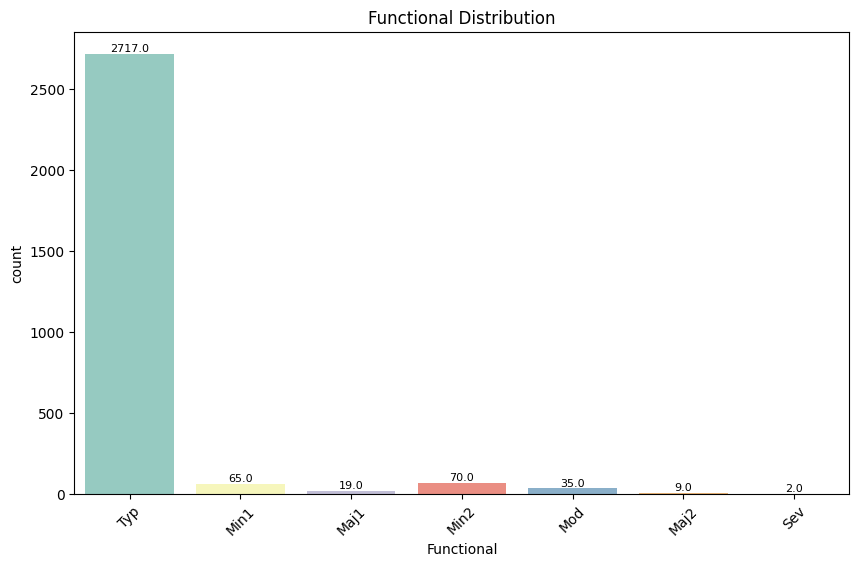

             FireplaceQu  Ratio
FireplaceQu                    
Gd                   744 25.488
TA                   592 20.281
Fa                    74  2.535
Po                    46  1.576
Ex                    43  1.473
##########################################


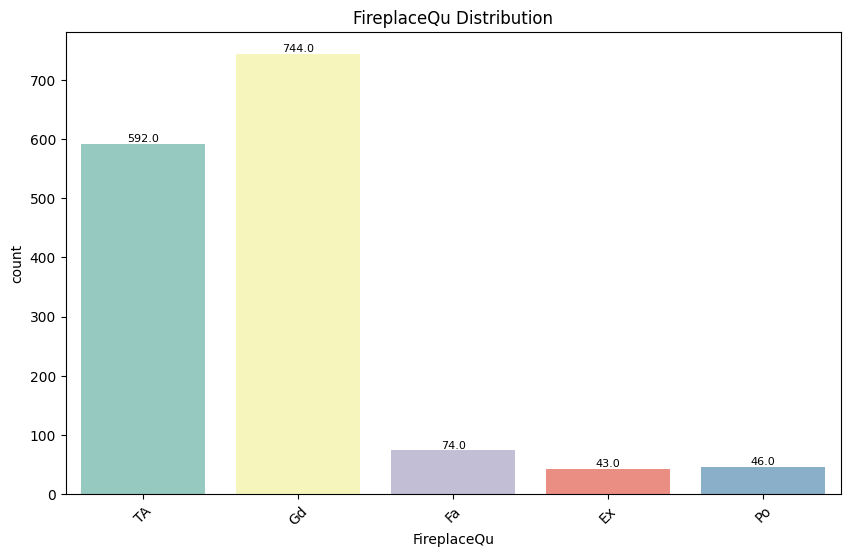

            GarageType  Ratio
GarageType                   
Attchd            1723 59.027
Detchd             779 26.687
BuiltIn            186  6.372
Basment             36  1.233
2Types              23  0.788
CarPort             15  0.514
##########################################


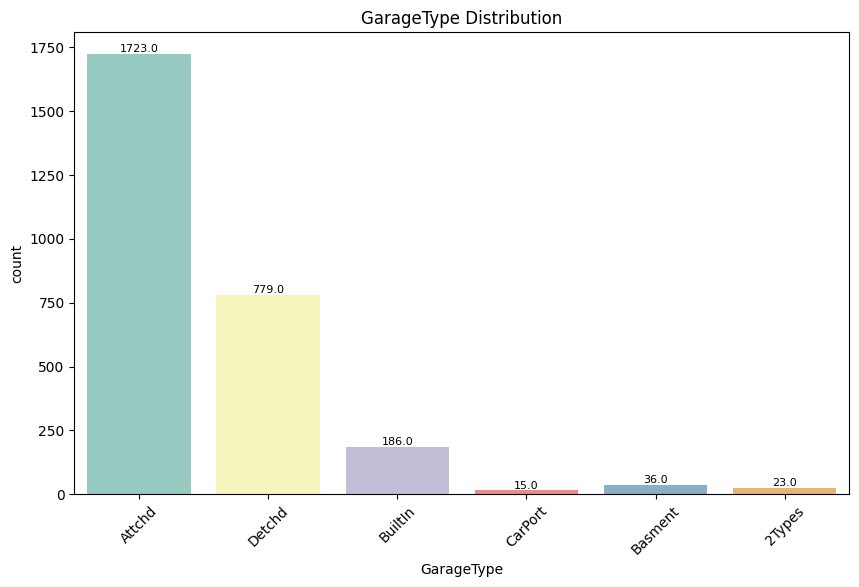

              GarageFinish  Ratio
GarageFinish                     
Unf                   1230 42.138
RFn                    811 27.783
Fin                    719 24.632
##########################################


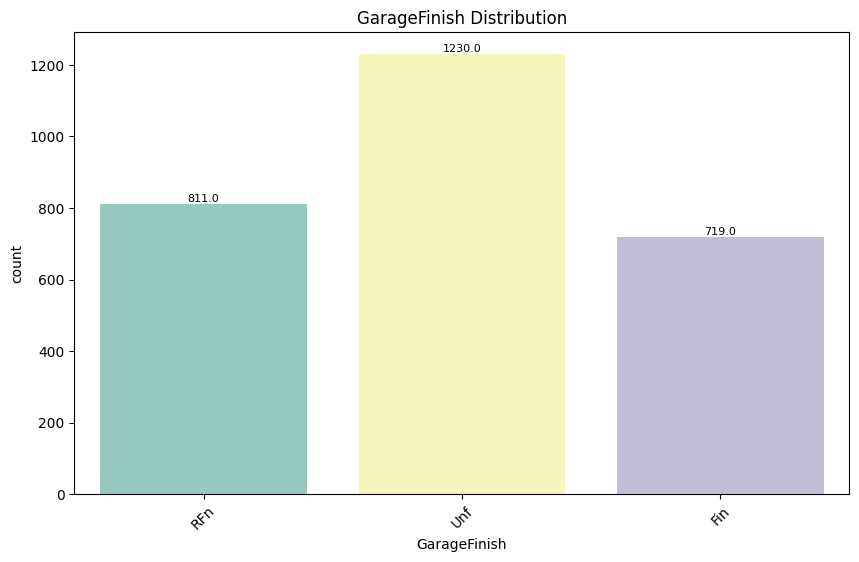

            GarageQual  Ratio
GarageQual                   
TA                2604 89.209
Fa                 124  4.248
Gd                  24  0.822
Po                   5  0.171
Ex                   3  0.103
##########################################


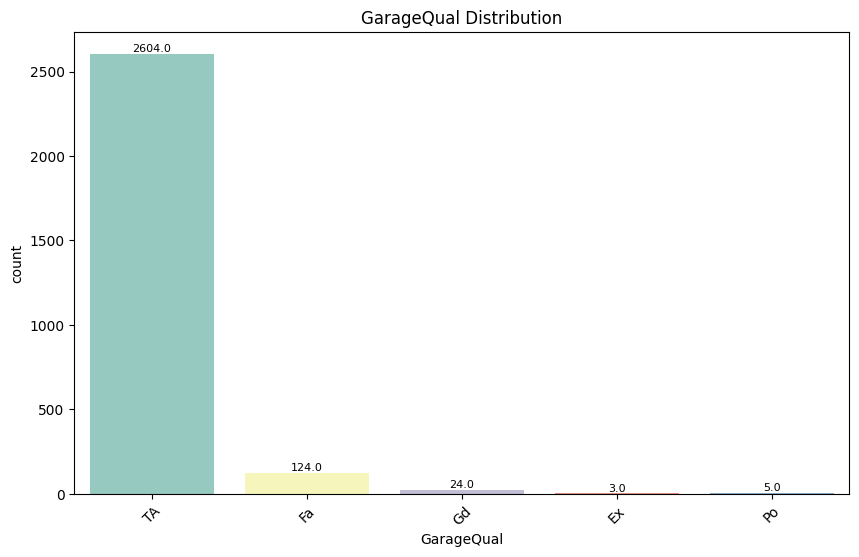

            GarageCond  Ratio
GarageCond                   
TA                2654 90.922
Fa                  74  2.535
Gd                  15  0.514
Po                  14  0.480
Ex                   3  0.103
##########################################


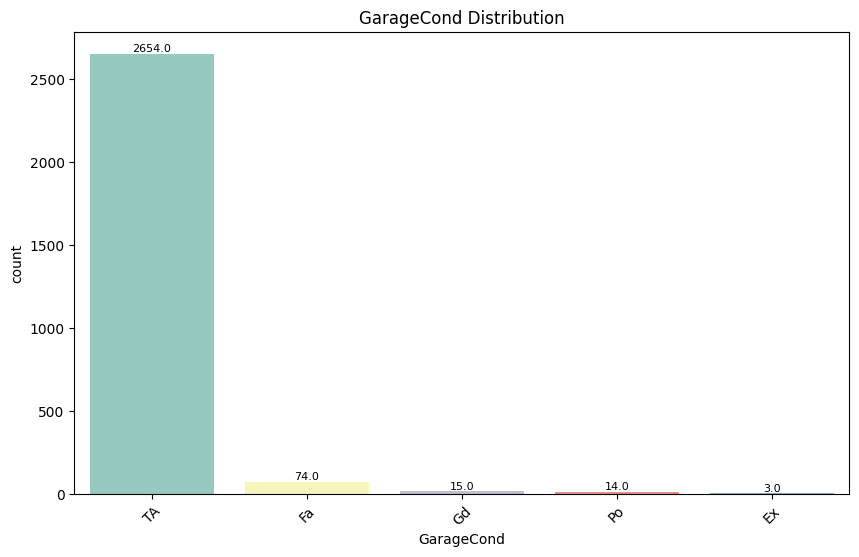

            PavedDrive  Ratio
PavedDrive                   
Y                 2641 90.476
N                  216  7.400
P                   62  2.124
##########################################


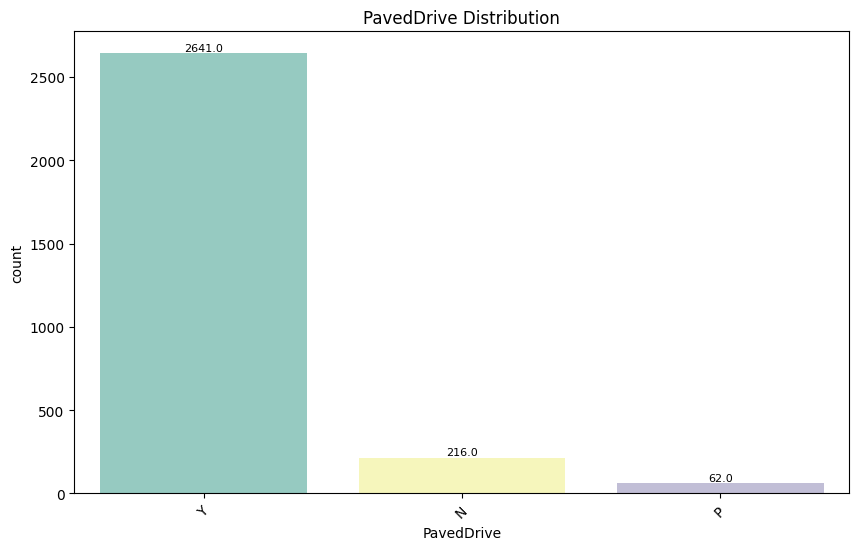

        PoolQC  Ratio
PoolQC               
Ex           4  0.137
Gd           4  0.137
Fa           2  0.069
##########################################


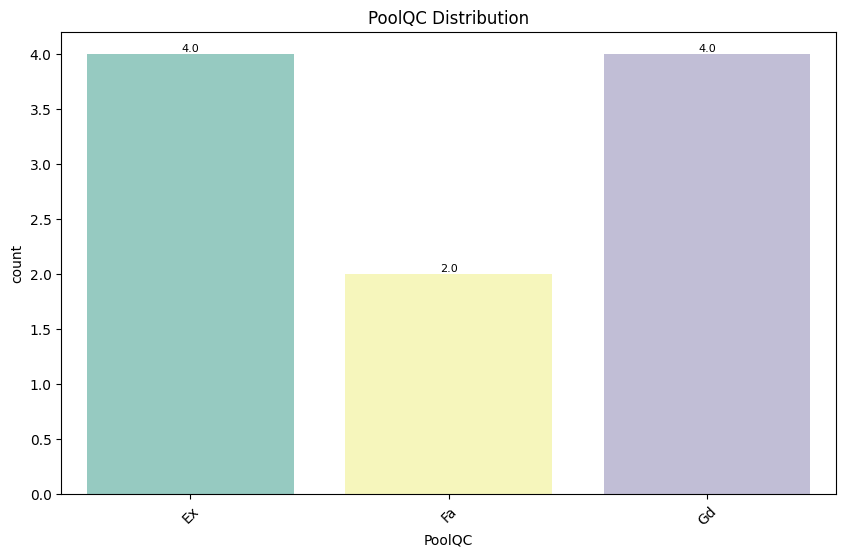

       Fence  Ratio
Fence              
MnPrv    329 11.271
GdPrv    118  4.042
GdWo     112  3.837
MnWw      12  0.411
##########################################


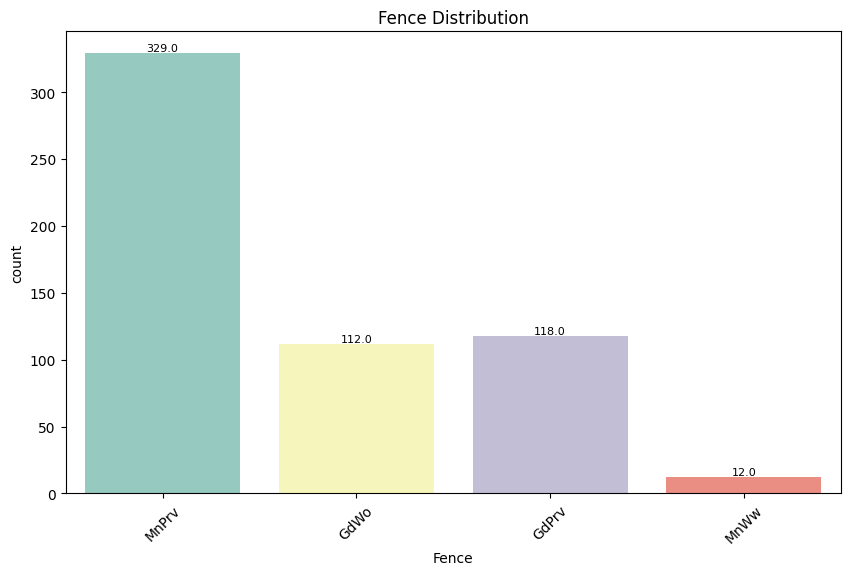

             MiscFeature  Ratio
MiscFeature                    
Shed                  95  3.255
Gar2                   5  0.171
Othr                   4  0.137
TenC                   1  0.034
##########################################


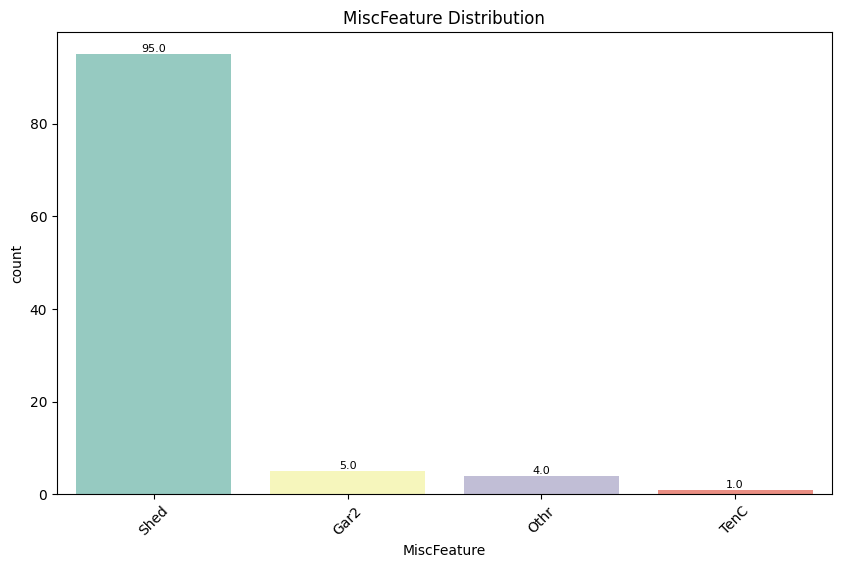

          SaleType  Ratio
SaleType                 
WD            2525 86.502
New            239  8.188
COD             87  2.980
ConLD           26  0.891
CWD             12  0.411
ConLI            9  0.308
ConLw            8  0.274
Oth              7  0.240
Con              5  0.171
##########################################


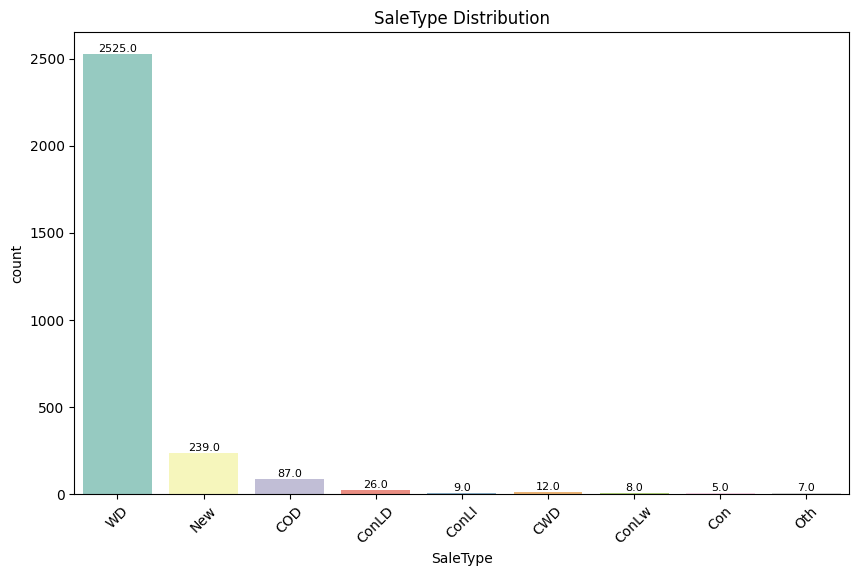

               SaleCondition  Ratio
SaleCondition                      
Normal                  2402 82.288
Partial                  245  8.393
Abnorml                  190  6.509
Family                    46  1.576
Alloca                    24  0.822
AdjLand                   12  0.411
##########################################


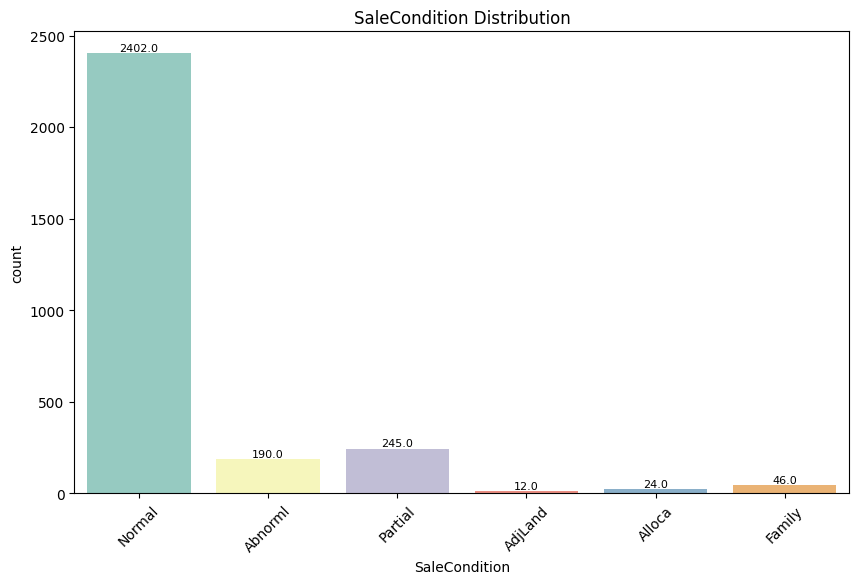

             OverallCond  Ratio
OverallCond                    
5                   1645 56.355
6                    531 18.191
7                    390 13.361
8                    144  4.933
4                    101  3.460
3                     50  1.713
9                     41  1.405
2                     10  0.343
1                      7  0.240
##########################################


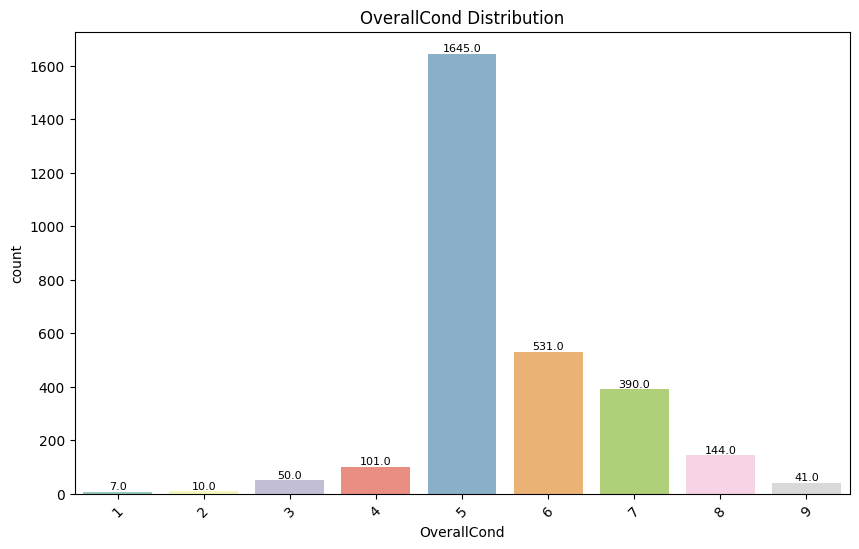

              BsmtFullBath  Ratio
BsmtFullBath                     
0.000                 1705 58.410
1.000                 1172 40.151
2.000                   38  1.302
3.000                    2  0.069
##########################################


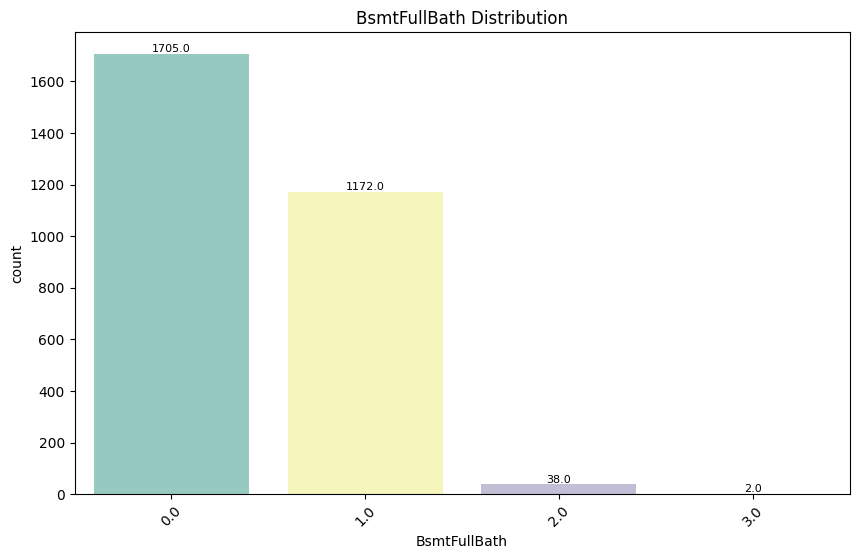

              BsmtHalfBath  Ratio
BsmtHalfBath                     
0.000                 2742 93.936
1.000                  171  5.858
2.000                    4  0.137
##########################################


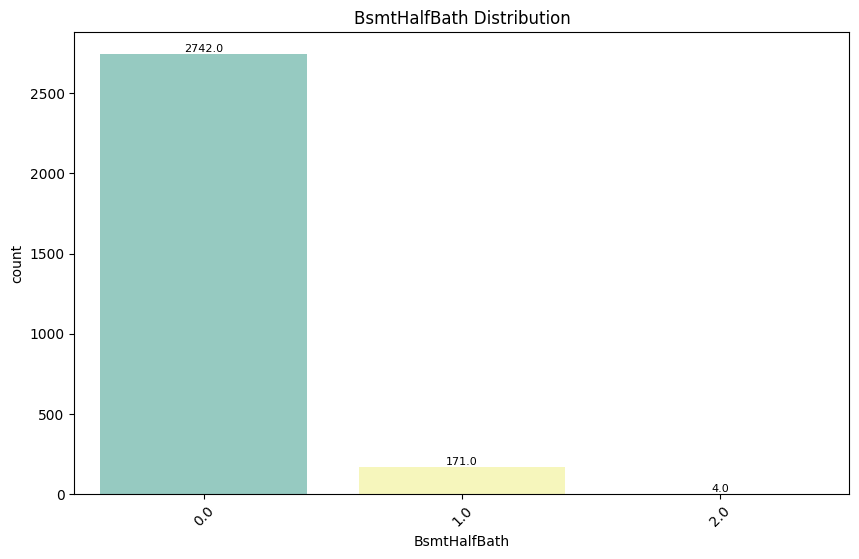

          FullBath  Ratio
FullBath                 
2             1530 52.415
1             1309 44.844
3               64  2.193
0               12  0.411
4                4  0.137
##########################################


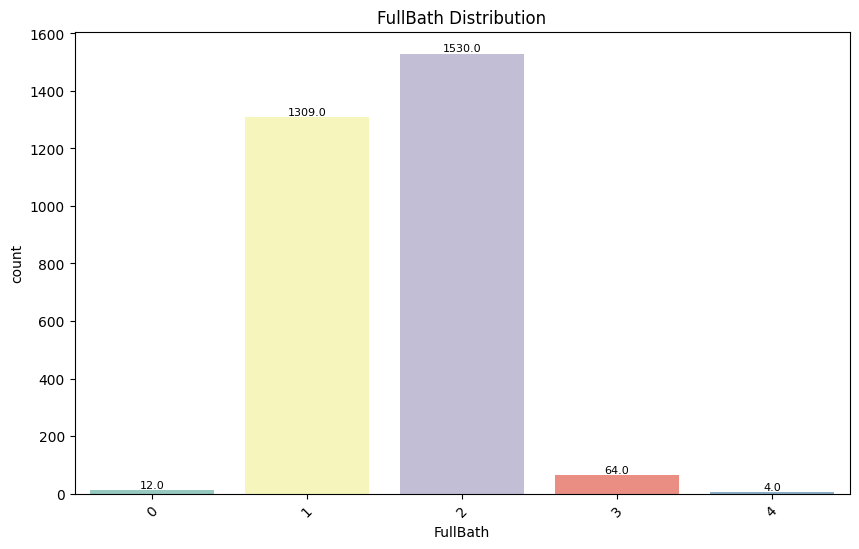

          HalfBath  Ratio
HalfBath                 
0             1834 62.830
1             1060 36.314
2               25  0.856
##########################################


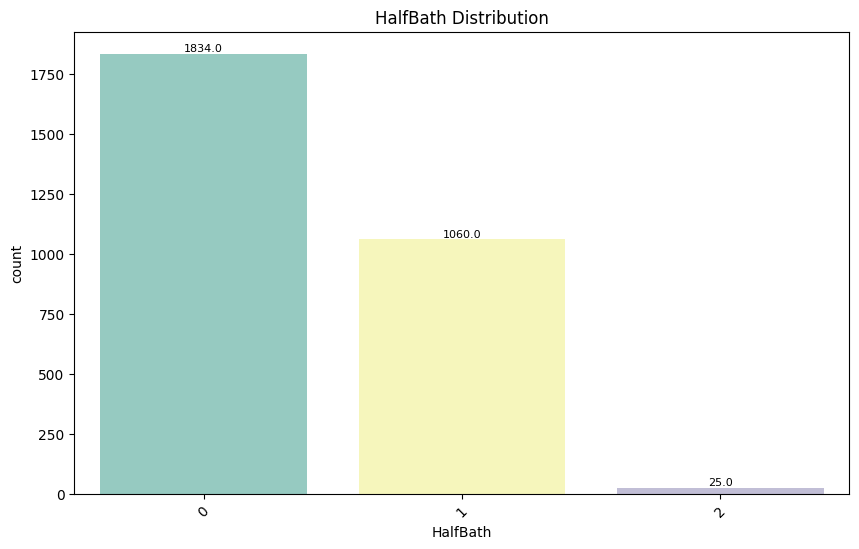

              BedroomAbvGr  Ratio
BedroomAbvGr                     
3                     1596 54.676
2                      742 25.420
4                      400 13.703
1                      103  3.529
5                       48  1.644
6                       21  0.719
0                        8  0.274
8                        1  0.034
##########################################


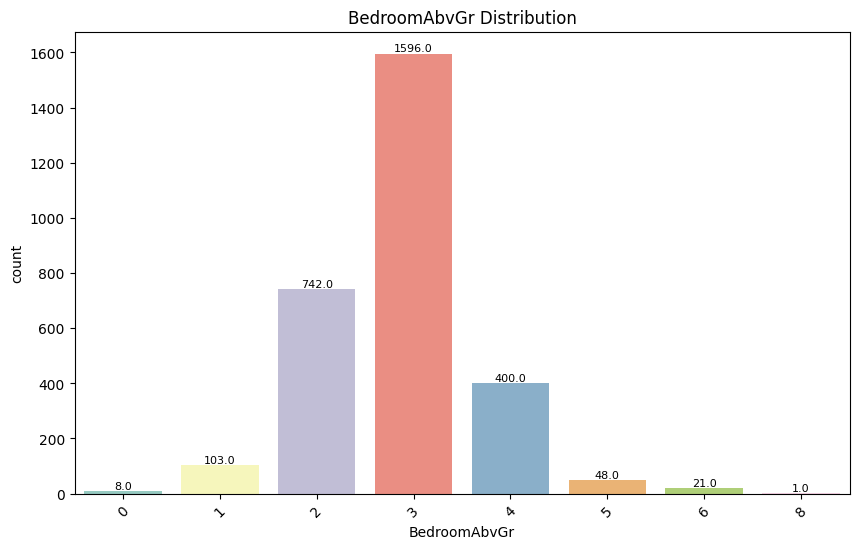

              KitchenAbvGr  Ratio
KitchenAbvGr                     
1                     2785 95.409
2                      129  4.419
0                        3  0.103
3                        2  0.069
##########################################


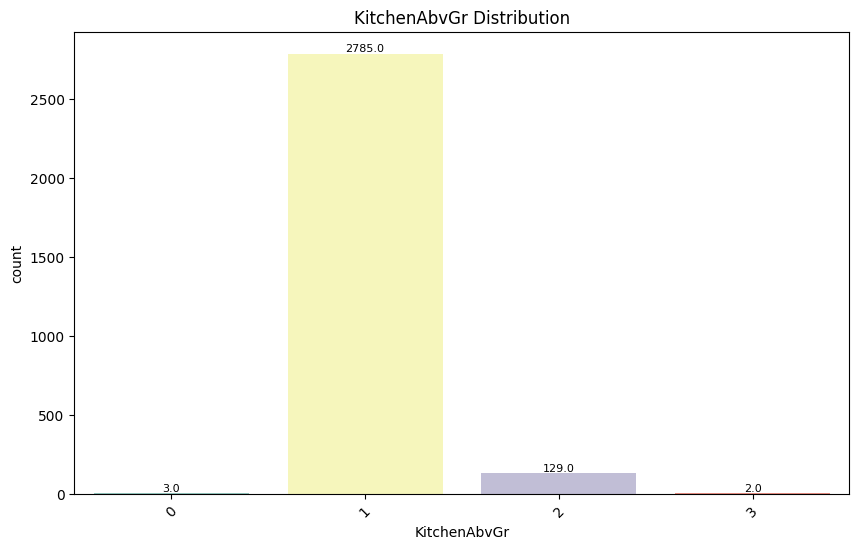

            Fireplaces  Ratio
Fireplaces                   
0                 1420 48.647
1                 1268 43.440
2                  219  7.503
3                   11  0.377
4                    1  0.034
##########################################


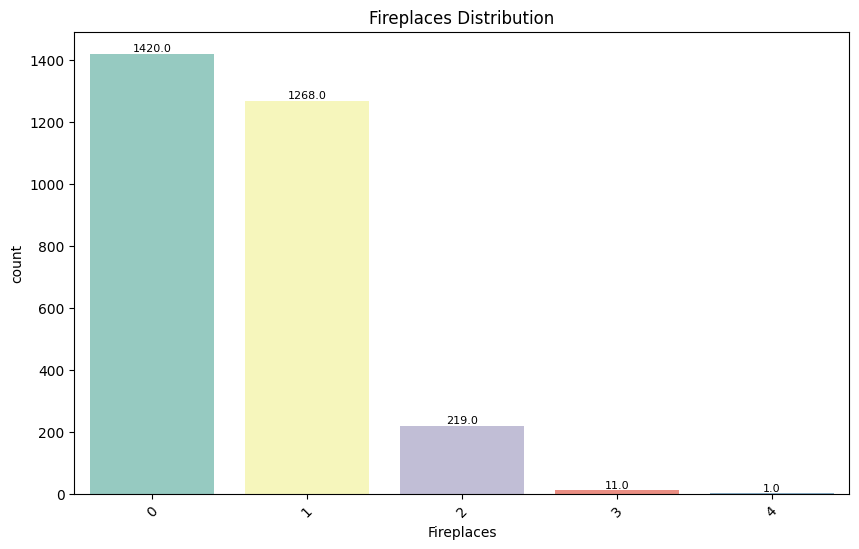

            GarageCars  Ratio
GarageCars                   
2.000             1594 54.608
1.000              776 26.584
3.000              374 12.813
0.000              157  5.379
4.000               16  0.548
5.000                1  0.034
##########################################


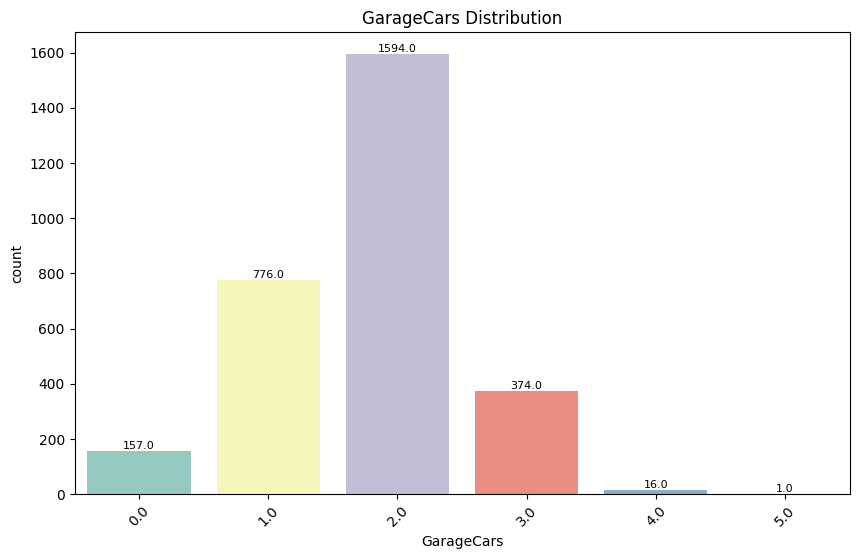

        YrSold  Ratio
YrSold               
2007       692 23.707
2009       647 22.165
2008       622 21.309
2006       619 21.206
2010       339 11.614
##########################################


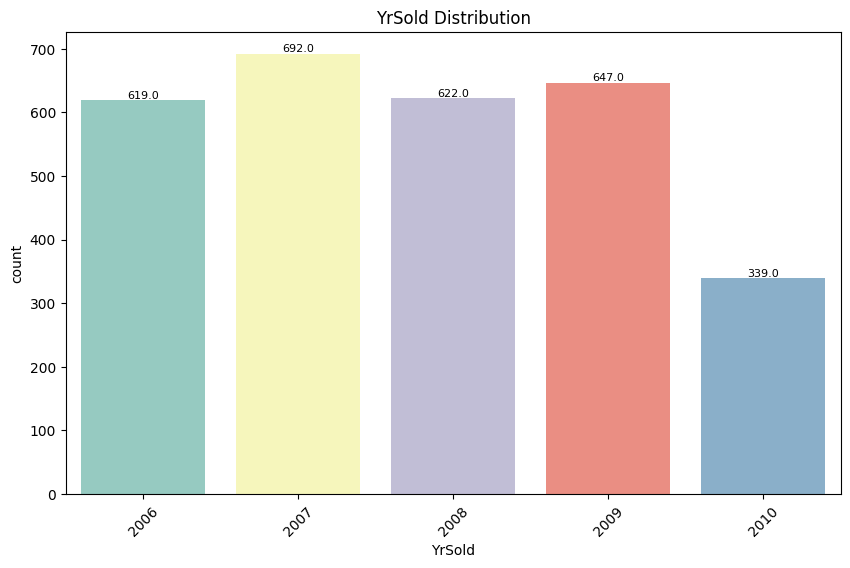

In [11]:
def cat_summary(dataframe, col_name, plot=False):
	print(pd.DataFrame({col_name: dataframe[col_name].value_counts(),
	                    "Ratio": 100 * dataframe[col_name].value_counts() / len(dataframe)}))
	print("##########################################")
	if plot:
		plt.figure(figsize=(10, 6))
		ax = sns.countplot(data=dataframe, x=col_name, palette="Set3")
		plt.title(f'{col_name} Distribution')
		plt.xticks(rotation=45)
		# Her sütunun üzerine frekansları yazdırma
		for p in ax.patches:
			ax.text(p.get_x() + p.get_width() / 2., p.get_height(), f'\n{p.get_height()}',
			        ha='center', va='bottom', fontsize=8, color='black')
		plt.show()


for col in cat_cols:
	cat_summary(df, col, plot=True)


## 1.3. Analysis of the Numerical Variables

Summary Statistics of Numerical Variables:
count   2919.000
mean    1460.000
std      842.787
min        1.000
5%       146.900
10%      292.800
20%      584.600
30%      876.400
40%     1168.200
50%     1460.000
60%     1751.800
70%     2043.600
80%     2335.400
90%     2627.200
95%     2773.100
99%     2889.820
max     2919.000
Name: Id, dtype: float64


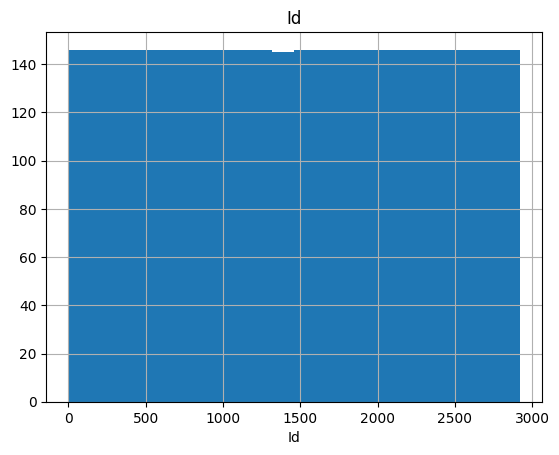

Summary Statistics of Numerical Variables:
count   2919.000
mean      57.138
std       42.518
min       20.000
5%        20.000
10%       20.000
20%       20.000
30%       20.000
40%       30.000
50%       50.000
60%       60.000
70%       60.000
80%       80.000
90%      120.000
95%      160.000
99%      190.000
max      190.000
Name: MSSubClass, dtype: float64


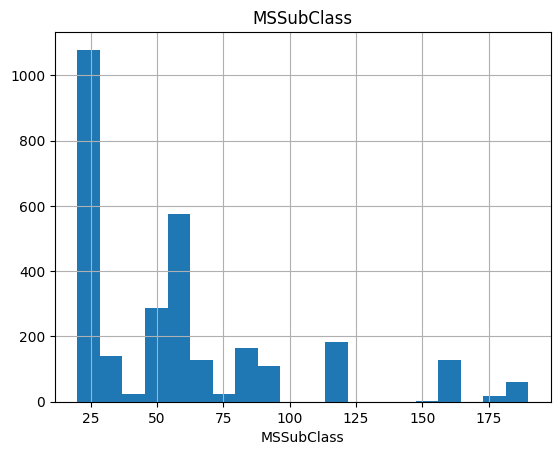

Summary Statistics of Numerical Variables:
count   2433.000
mean      69.306
std       23.345
min       21.000
5%        32.000
10%       43.000
20%       53.000
30%       60.000
40%       63.000
50%       68.000
60%       73.000
70%       78.000
80%       84.000
90%       95.000
95%      107.000
99%      135.680
max      313.000
Name: LotFrontage, dtype: float64


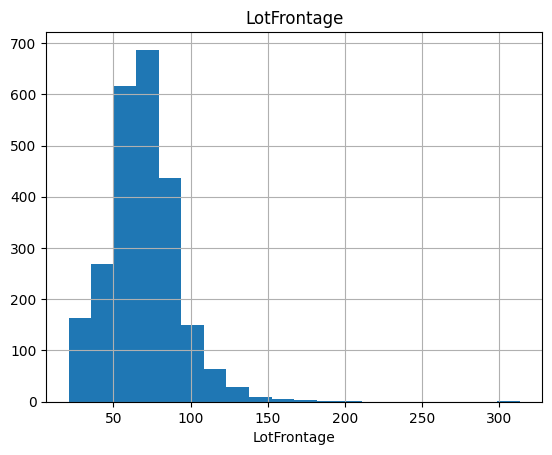

Summary Statistics of Numerical Variables:
count     2919.000
mean     10168.114
std       7886.996
min       1300.000
5%        3182.000
10%       4922.400
20%       7007.600
30%       7960.400
40%       8741.000
50%       9453.000
60%      10151.600
70%      11001.200
80%      12203.800
90%      14300.600
95%      17142.900
99%      33038.640
max     215245.000
Name: LotArea, dtype: float64


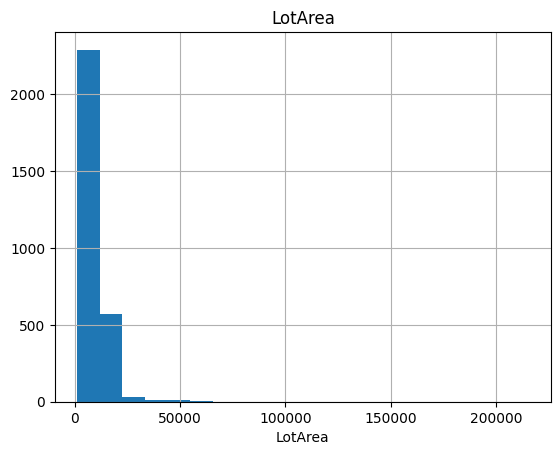

Summary Statistics of Numerical Variables:
count   2919.000
mean       6.089
std        1.410
min        1.000
5%         4.000
10%        5.000
20%        5.000
30%        5.000
40%        6.000
50%        6.000
60%        6.000
70%        7.000
80%        7.000
90%        8.000
95%        8.000
99%       10.000
max       10.000
Name: OverallQual, dtype: float64


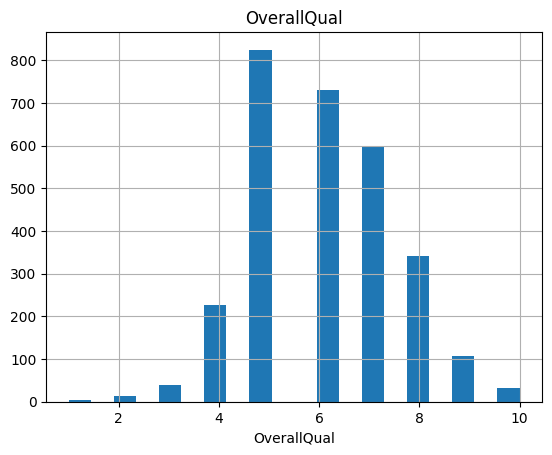

Summary Statistics of Numerical Variables:
count   2919.000
mean    1971.313
std       30.291
min     1872.000
5%      1915.000
10%     1924.000
20%     1947.000
30%     1957.000
40%     1965.000
50%     1973.000
60%     1984.000
70%     1998.000
80%     2003.000
90%     2006.000
95%     2007.000
99%     2008.000
max     2010.000
Name: YearBuilt, dtype: float64


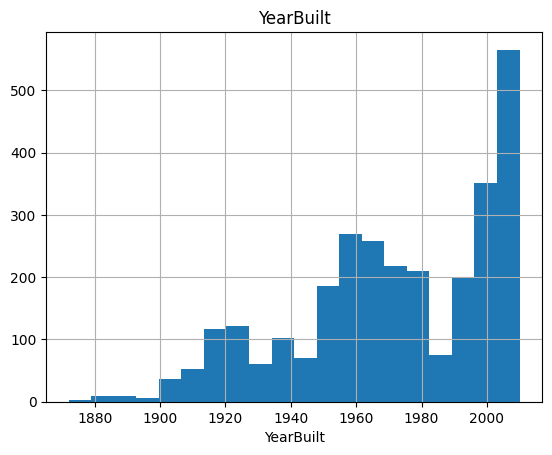

Summary Statistics of Numerical Variables:
count   2919.000
mean    1984.264
std       20.894
min     1950.000
5%      1950.000
10%     1950.000
20%     1960.000
30%     1970.000
40%     1978.000
50%     1993.000
60%     1998.000
70%     2002.000
80%     2005.000
90%     2006.200
95%     2007.000
99%     2009.000
max     2010.000
Name: YearRemodAdd, dtype: float64


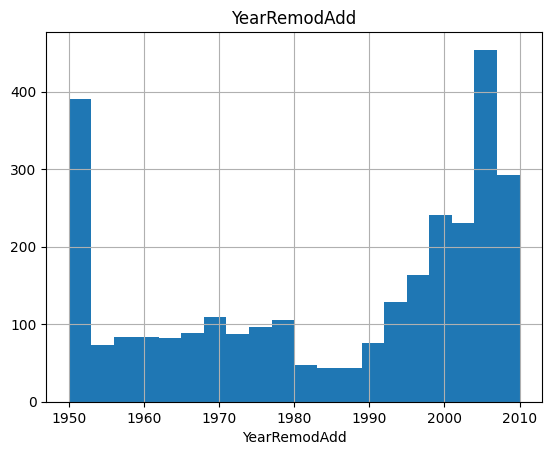

Summary Statistics of Numerical Variables:
count   2896.000
mean     102.201
std      179.334
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%      120.000
80%      202.000
90%      325.500
95%      466.500
99%      771.050
max     1600.000
Name: MasVnrArea, dtype: float64


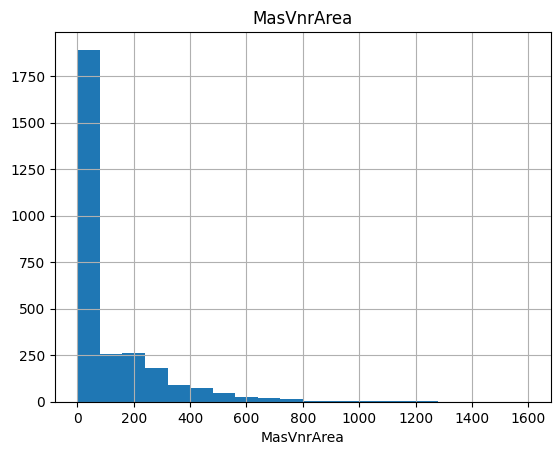

Summary Statistics of Numerical Variables:
count   2918.000
mean     441.423
std      455.611
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%      202.600
50%      368.500
60%      515.200
70%      656.000
80%      812.000
90%     1056.900
95%     1274.000
99%     1635.320
max     5644.000
Name: BsmtFinSF1, dtype: float64


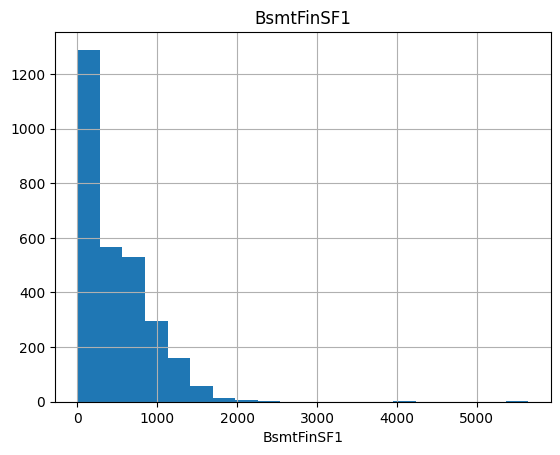

Summary Statistics of Numerical Variables:
count   2918.000
mean      49.582
std      169.206
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%      125.600
95%      435.000
99%      874.660
max     1526.000
Name: BsmtFinSF2, dtype: float64


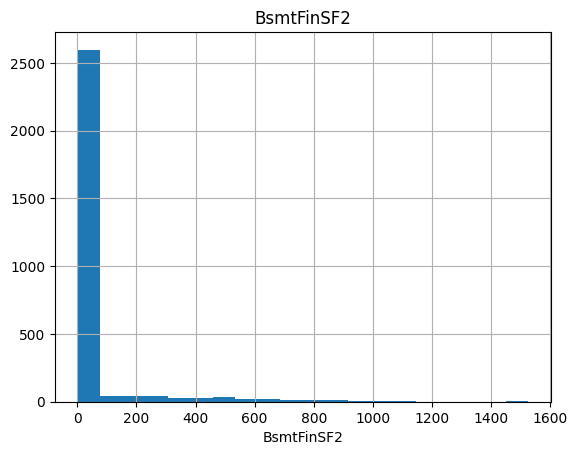

Summary Statistics of Numerical Variables:
count   2918.000
mean     560.772
std      439.544
min        0.000
5%         0.000
10%       56.000
20%      174.000
30%      270.000
40%      365.800
50%      467.000
60%      595.000
70%      732.000
80%      892.600
90%     1212.600
95%     1474.900
99%     1776.490
max     2336.000
Name: BsmtUnfSF, dtype: float64


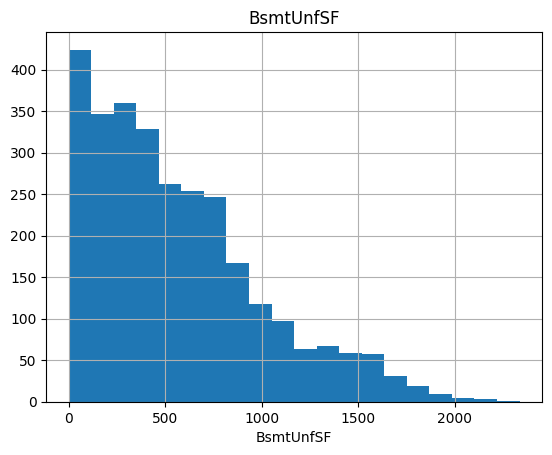

Summary Statistics of Numerical Variables:
count   2918.000
mean    1051.778
std      440.766
min        0.000
5%       455.250
10%      600.000
20%      741.000
30%      836.000
40%      911.000
50%      989.500
60%     1089.200
70%     1216.000
80%     1392.000
90%     1614.000
95%     1776.150
99%     2198.300
max     6110.000
Name: TotalBsmtSF, dtype: float64


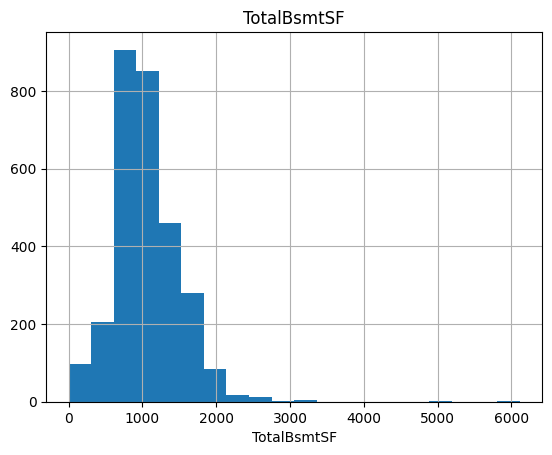

Summary Statistics of Numerical Variables:
count   2919.000
mean    1159.582
std      392.362
min      334.000
5%       665.900
10%      744.800
20%      847.000
30%      914.000
40%      996.200
50%     1082.000
60%     1180.000
70%     1314.000
80%     1483.400
90%     1675.000
95%     1830.100
99%     2288.020
max     5095.000
Name: 1stFlrSF, dtype: float64


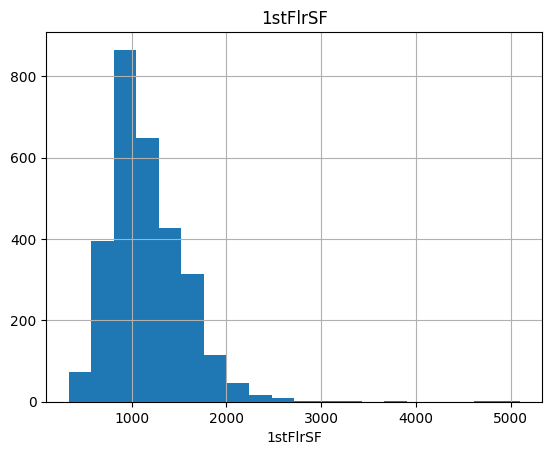

Summary Statistics of Numerical Variables:
count   2919.000
mean     336.484
std      428.701
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%      427.400
70%      636.000
80%      770.800
90%      925.000
95%     1131.200
99%     1400.200
max     2065.000
Name: 2ndFlrSF, dtype: float64


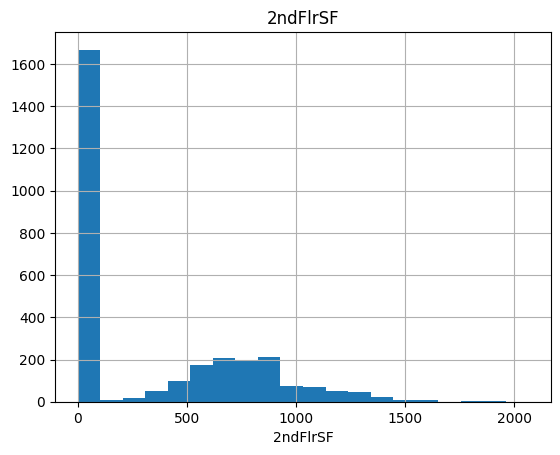

Summary Statistics of Numerical Variables:
count   2919.000
mean       4.694
std       46.397
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%        0.000
95%        0.000
99%      153.840
max     1064.000
Name: LowQualFinSF, dtype: float64


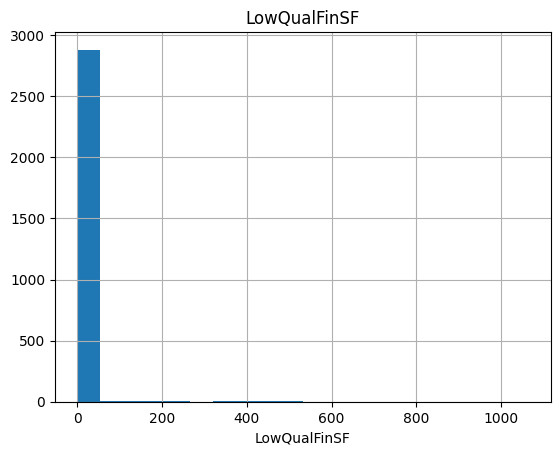

Summary Statistics of Numerical Variables:
count   2919.000
mean    1500.760
std      506.051
min      334.000
5%       861.000
10%      923.800
20%     1064.600
30%     1200.000
40%     1329.200
50%     1444.000
60%     1560.000
70%     1680.000
80%     1838.400
90%     2153.200
95%     2464.200
99%     2935.720
max     5642.000
Name: GrLivArea, dtype: float64


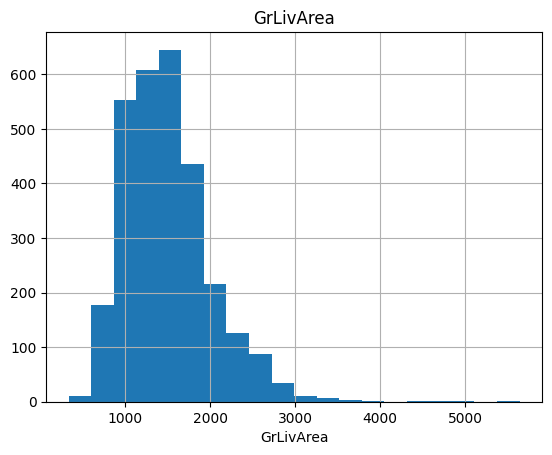

Summary Statistics of Numerical Variables:
count   2919.000
mean       6.452
std        1.569
min        2.000
5%         4.000
10%        5.000
20%        5.000
30%        6.000
40%        6.000
50%        6.000
60%        7.000
70%        7.000
80%        8.000
90%        8.000
95%        9.000
99%       11.000
max       15.000
Name: TotRmsAbvGrd, dtype: float64


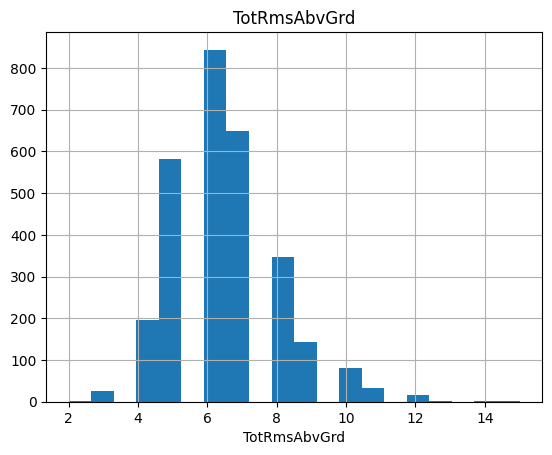

Summary Statistics of Numerical Variables:
count   2760.000
mean    1978.113
std       25.574
min     1895.000
5%      1928.000
10%     1941.000
20%     1957.000
30%     1964.000
40%     1972.000
50%     1979.000
60%     1993.000
70%     1999.000
80%     2004.000
90%     2006.000
95%     2007.000
99%     2009.000
max     2207.000
Name: GarageYrBlt, dtype: float64


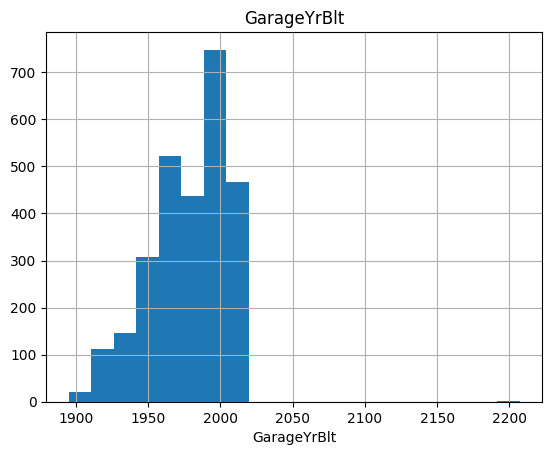

Summary Statistics of Numerical Variables:
count   2918.000
mean     472.875
std      215.395
min        0.000
5%         0.000
10%      240.000
20%      296.000
30%      379.000
40%      440.000
50%      480.000
60%      513.000
70%      560.900
80%      621.000
90%      758.000
95%      856.150
99%     1019.490
max     1488.000
Name: GarageArea, dtype: float64


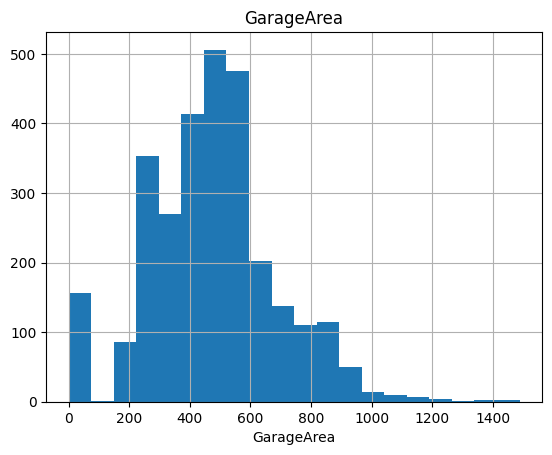

Summary Statistics of Numerical Variables:
count   2919.000
mean      93.710
std      126.527
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%      100.000
70%      144.000
80%      192.000
90%      257.000
95%      328.000
99%      500.820
max     1424.000
Name: WoodDeckSF, dtype: float64


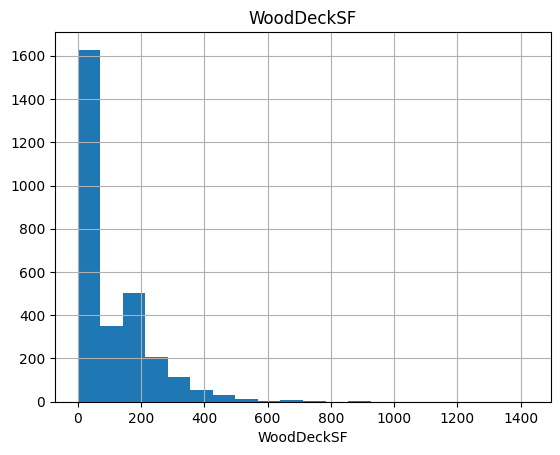

Summary Statistics of Numerical Variables:
count   2919.000
mean      47.487
std       67.575
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%       26.000
60%       40.000
70%       58.000
80%       85.000
90%      131.200
95%      183.100
99%      284.460
max      742.000
Name: OpenPorchSF, dtype: float64


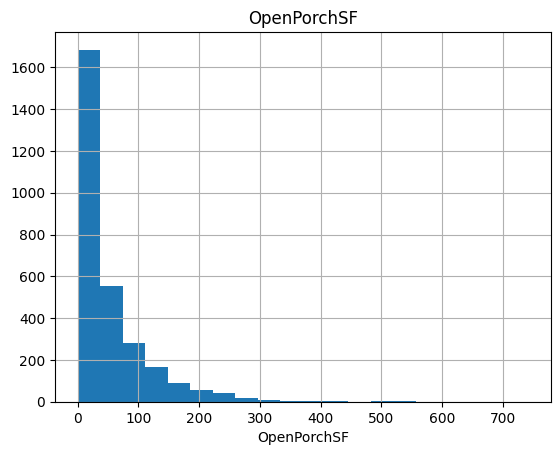

Summary Statistics of Numerical Variables:
count   2919.000
mean      23.098
std       64.244
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%      112.000
95%      176.000
99%      264.000
max     1012.000
Name: EnclosedPorch, dtype: float64


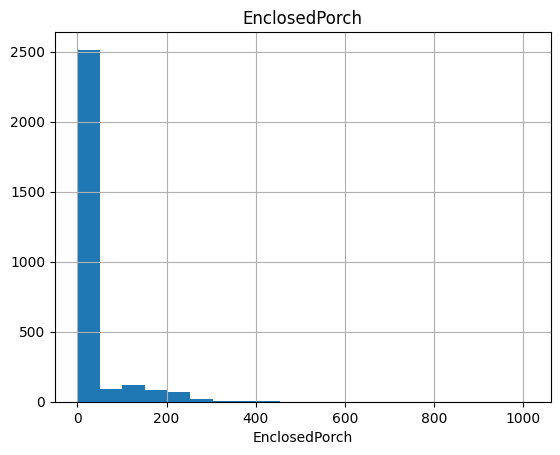

Summary Statistics of Numerical Variables:
count   2919.000
mean       2.602
std       25.188
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%        0.000
95%        0.000
99%      144.000
max      508.000
Name: 3SsnPorch, dtype: float64


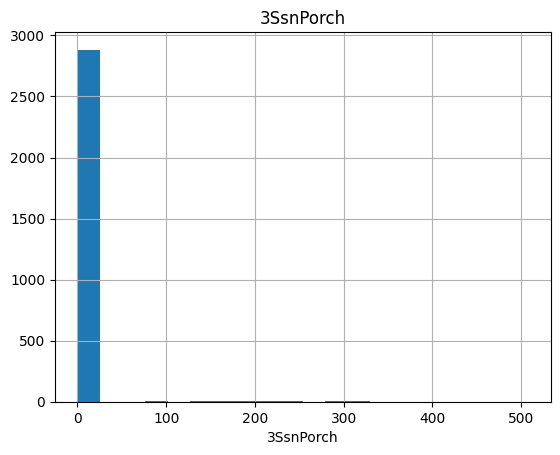

Summary Statistics of Numerical Variables:
count   2919.000
mean      16.062
std       56.184
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%        0.000
95%      161.000
99%      259.820
max      576.000
Name: ScreenPorch, dtype: float64


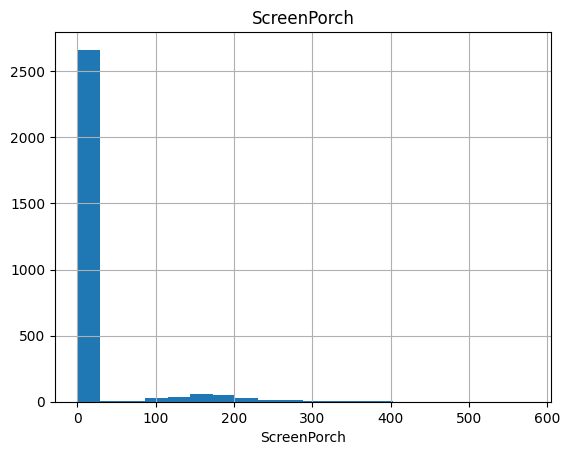

Summary Statistics of Numerical Variables:
count   2919.000
mean       2.252
std       35.664
min        0.000
5%         0.000
10%        0.000
20%        0.000
30%        0.000
40%        0.000
50%        0.000
60%        0.000
70%        0.000
80%        0.000
90%        0.000
95%        0.000
99%        0.000
max      800.000
Name: PoolArea, dtype: float64


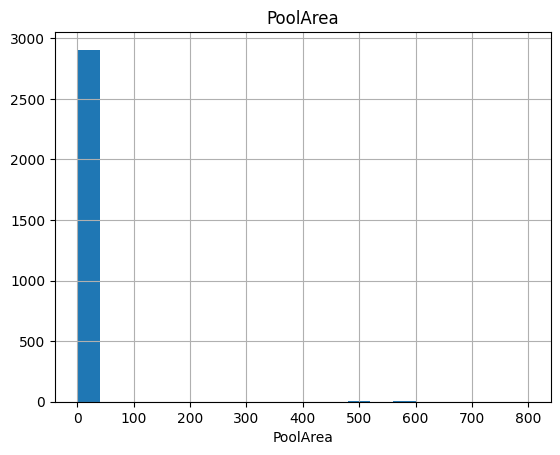

Summary Statistics of Numerical Variables:
count    2919.000
mean       50.826
std       567.402
min         0.000
5%          0.000
10%         0.000
20%         0.000
30%         0.000
40%         0.000
50%         0.000
60%         0.000
70%         0.000
80%         0.000
90%         0.000
95%         0.000
99%       982.000
max     17000.000
Name: MiscVal, dtype: float64


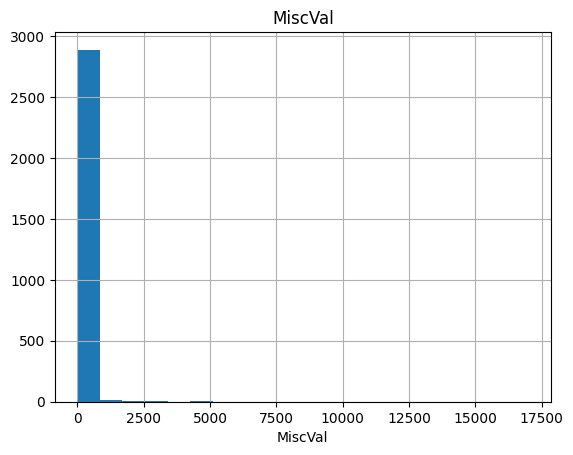

Summary Statistics of Numerical Variables:
count   2919.000
mean       6.213
std        2.715
min        1.000
5%         2.000
10%        3.000
20%        4.000
30%        5.000
40%        6.000
50%        6.000
60%        7.000
70%        7.000
80%        8.000
90%       10.000
95%       11.000
99%       12.000
max       12.000
Name: MoSold, dtype: float64


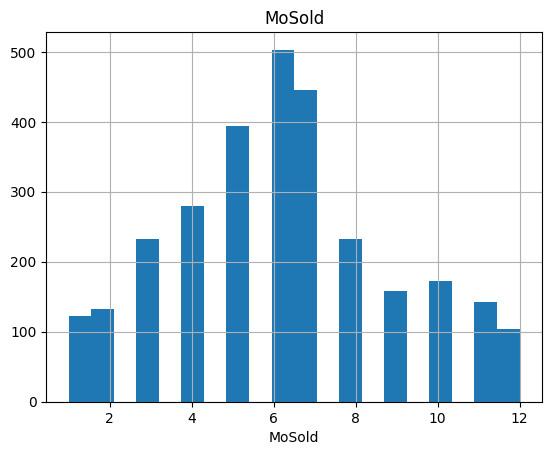

Summary Statistics of Numerical Variables:
count     1460.000
mean    180921.196
std      79442.503
min      34900.000
5%       88000.000
10%     106475.000
20%     124000.000
30%     135500.000
40%     147000.000
50%     163000.000
60%     179280.000
70%     198620.000
80%     230000.000
90%     278000.000
95%     326100.000
99%     442567.010
max     755000.000
Name: SalePrice, dtype: float64


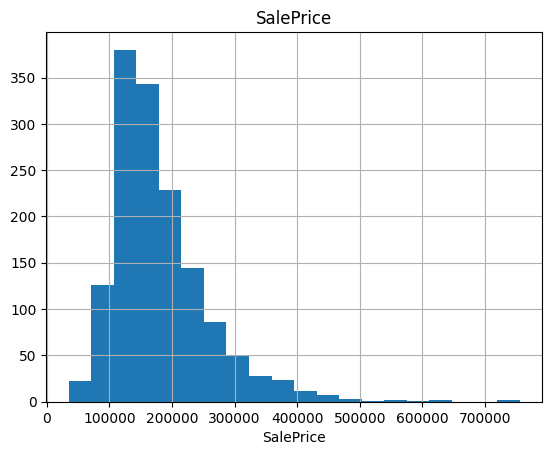

In [12]:

def num_summary(dataframe, numerical_col, plot=False):
    print("Summary Statistics of Numerical Variables:")
    quantiles = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 0.99]
    print(dataframe[numerical_col].describe(quantiles).T)
    if plot:
        dataframe[numerical_col].hist(bins=20)
        plt.xlabel(numerical_col)
        plt.title(numerical_col)
        plt.show(block=True)


for col in num_cols:
    num_summary(df, col, plot=True)


### 1.3.1 Visualization of the Categorical Variables

*****************************************

               mean  count
MSZoning                  
C (all)   74528.000     10
FV       214014.062     65
RH       131558.375     16
RL       191004.995   1151
RM       126316.830    218
*****************************************

             mean  count
Street                  
Grvl   130190.500      6
Pave   181130.539   1454
*****************************************

            mean  count
Alley                  
Grvl  122219.080     50
Pave  168000.585     41
*****************************************

               mean  count
LotShape                  
IR1      206101.665    484
IR2      239833.366     41
IR3      216036.500     10
Reg      164754.818    925
*****************************************

                  mean  count
LandContour                  
Bnk         143104.079     63
HLS         231533.940     50
Low         203661.111     36
Lvl         180183.747   1311
*****************************************

               

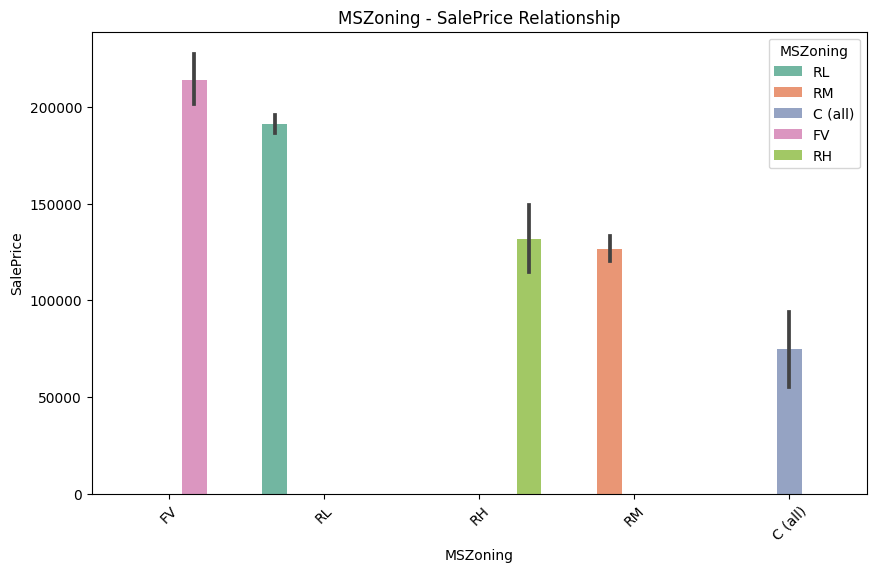

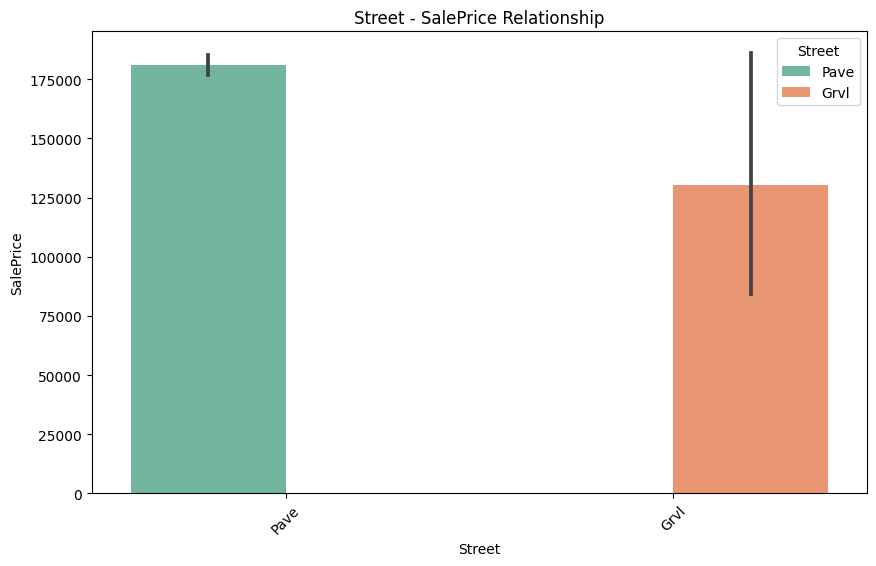

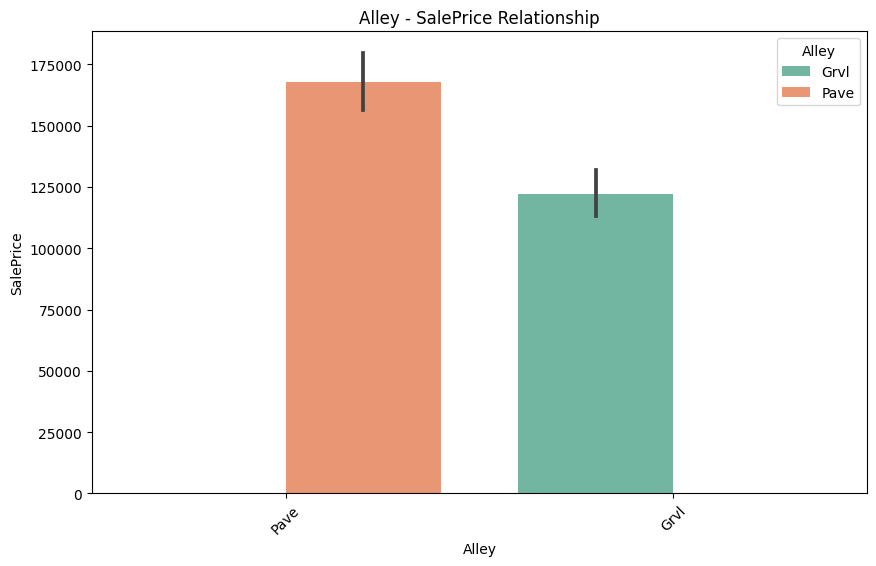

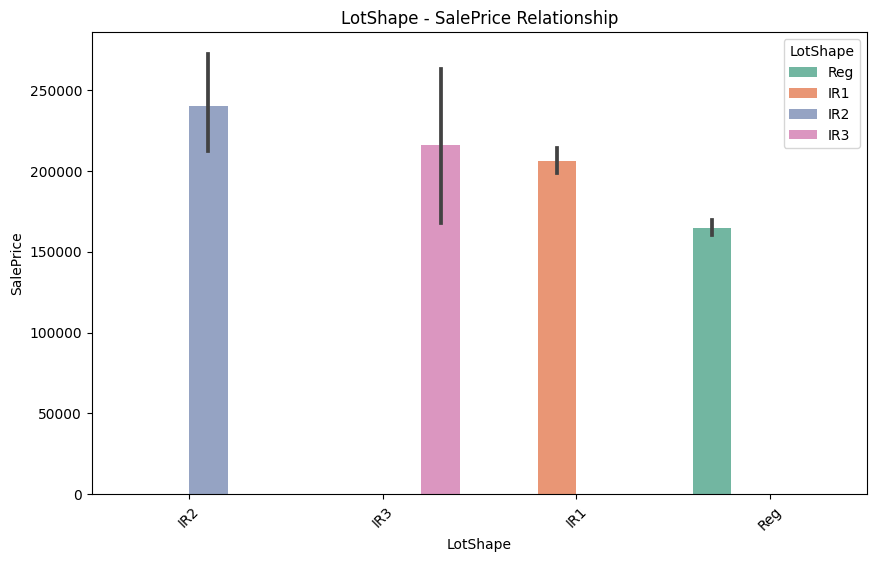

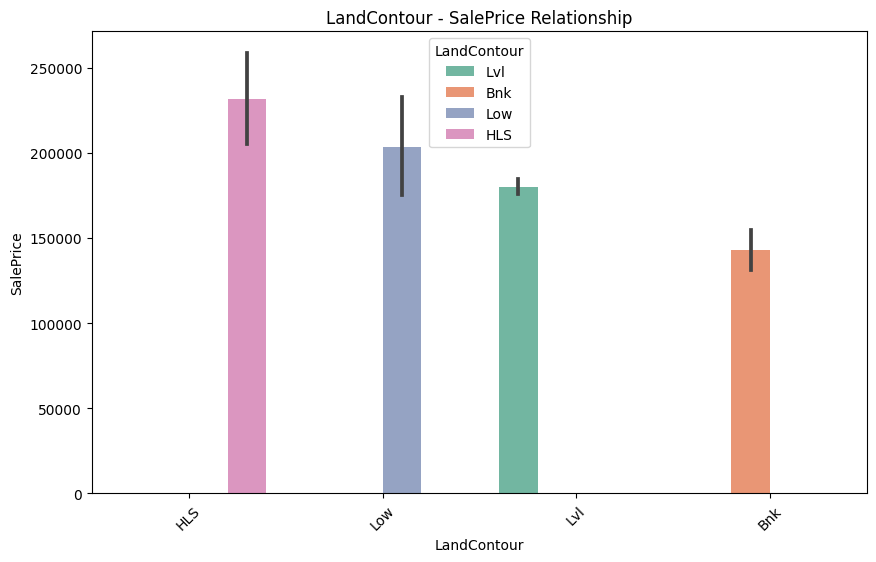

...

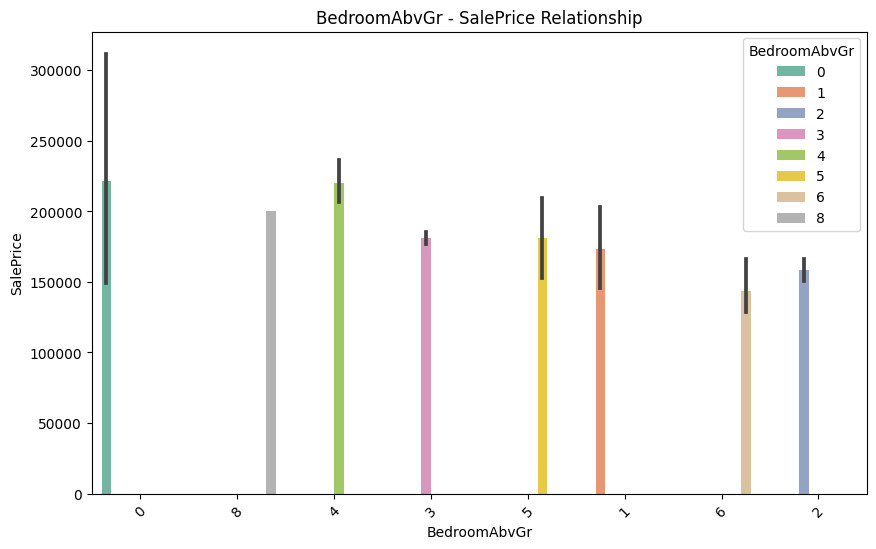

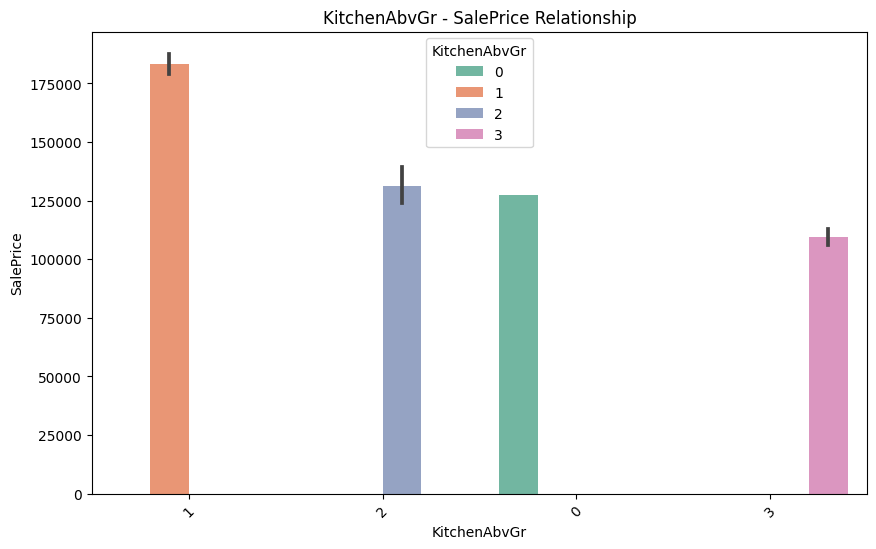

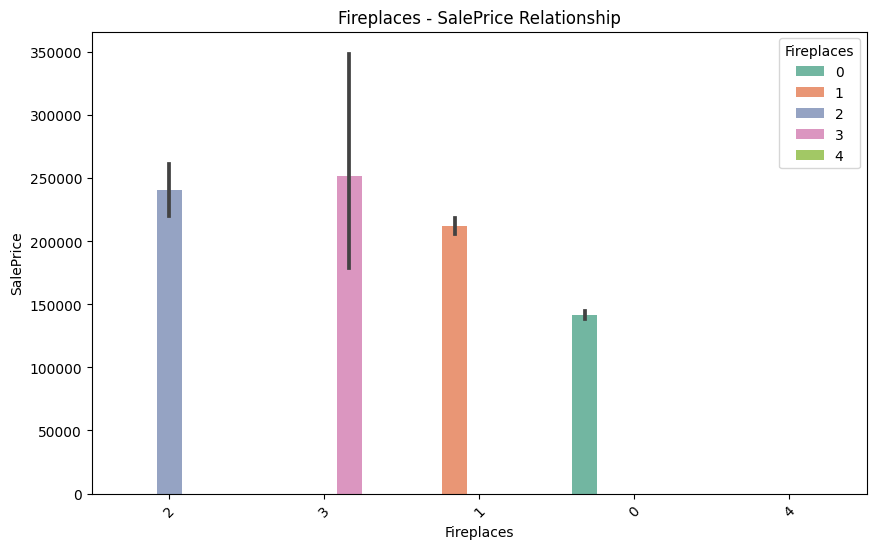

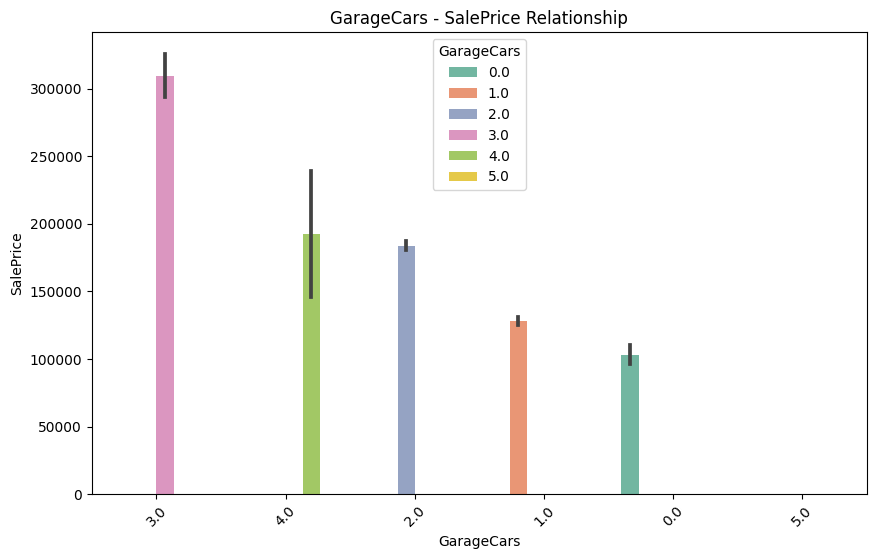

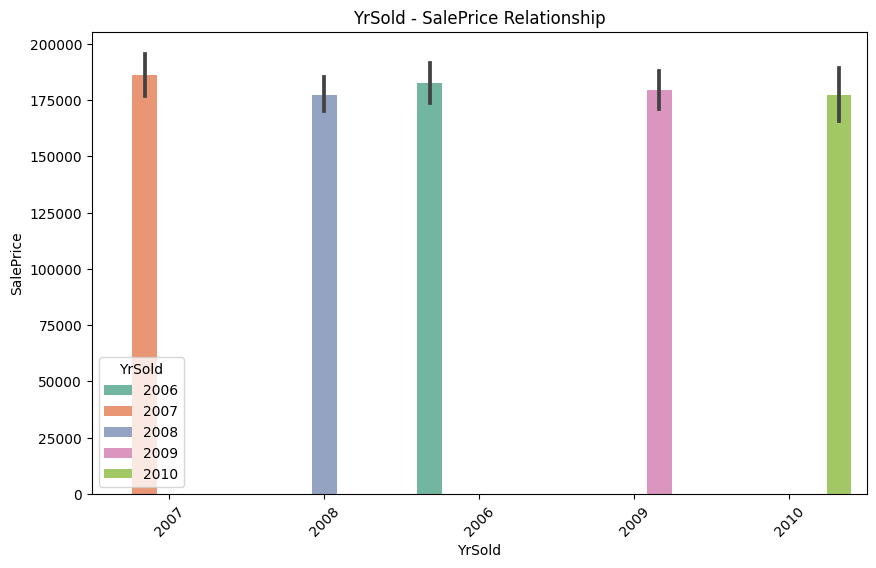

In [13]:
for col in cat_cols:
    print("*****************************************\n")
    print(df.groupby(col)['SalePrice'].agg(["mean", "count"]))


def analyze_categorical_relationship(data, target_column):
    cat_cols, num_cols, cat_but_car = grab_col_names(df)
    
    for column in cat_cols:
        # Visualize the relationship between the categorical column and the target variable
        plt.figure(figsize=(10, 6))
        # sns.boxplot(data=data, x=column, y=target_column)
        # Group the columns by the target column and sort the columns within each group by their sizes
        sorted_columns = data.groupby(column)[target_column].median().sort_values(ascending=False).index
        sns.barplot(data=data, x=column, y=target_column, hue=column, order=sorted_columns, palette='Set2')
        plt.title(f'{column} - {target_column} Relationship')
        plt.xlabel(column)
        plt.ylabel(target_column)
        plt.xticks(rotation=45)
        plt.show(block=True)


analyze_categorical_relationship(df, 'SalePrice')


# 2. Data Pre-processing

## 2.1. Converting Data Types 

In [14]:
# Convert 'YrSold' column to year format
df['YrSold'] = pd.to_datetime(df['YrSold'], format='%Y').dt.year

# Convert 'YearBuilt' column to year format
df['YearBuilt'] = pd.to_datetime(df['YearBuilt'], format='%Y').dt.year

# Convert 'GarageYrBlt' column to year format

# Check for missing values in the column
# Replace non-finite values in 'GarageYrBlt' column with 0
df['GarageYrBlt'].fillna(0, inplace=True)

# Now, convert the 'GarageYrBlt' column to integer
df['GarageYrBlt'] = df['GarageYrBlt'].astype(int)


# Convert 'YearRemodAdd' column to year format
df['YearRemodAdd'] = pd.to_datetime(df['YearRemodAdd'], format='%Y').dt.year

# Check the current types of date columns
print(df.dtypes)

# Check the first few rows of date columns
print(df[['YrSold', 'YearBuilt', 'GarageYrBlt', 'YearRemodAdd']].head())


Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int32
YearRemodAdd       int32
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1       float64
BsmtFinType2      object
BsmtFinSF2       float64
BsmtUnfSF        float64
TotalBsmtSF      float64
Heating           object


In [15]:
# Convert 'MoSold' column to string format
df['MoSold'] = df['MoSold'].astype(str)

# Replace numerical month values with their corresponding month names in the 'MoSold' column
df['MoSold'] = df['MoSold'].replace({'1': 'January', '2': 'February', '3': 'March', '4': 'April',
                                     '5': 'May', '6': 'June', '7': 'July', '8': 'August',
                                     '9': 'September', '10': 'October', '11': 'November', '12': 'December'})

# List of columns to process
columns_to_process = ['SalePrice', "LotFrontage", 'GarageArea', 'GarageCars', "MasVnrArea", "BsmtHalfBath",
                      "BsmtFullBath", "BsmtFinSF1", "BsmtFinSF2", "BsmtUnfSF",
                      "TotalBsmtSF"]



In [16]:
df[columns_to_process].dtypes

SalePrice       float64
LotFrontage     float64
GarageArea      float64
GarageCars      float64
MasVnrArea      float64
BsmtHalfBath    float64
BsmtFullBath    float64
BsmtFinSF1      float64
BsmtFinSF2      float64
BsmtUnfSF       float64
TotalBsmtSF     float64
dtype: object

In [17]:
def convert_to_int(column):
    """
    Convert a column to integer type with nullable integer support.

    Parameters:
    column (pandas.Series): The column to be converted.

    Returns:
    pandas.Series: Converted column with nullable integer type if the original column is integer type, otherwise returns the original column.
    """
    if column.dtype == 'Int64':  # Check if the column is already nullable integer type
        return column
    elif column.dtype == 'float64':  # Check if the column is float type
        column = column.fillna(0)  # Replace NaN values with 0
        column = column.round()  # Round the values to the nearest integer
        return column.astype('Int64')  # Convert to nullable integer type
    else:
        return column  # Return the original column if it's not float or integer type


# Apply the convert_to_int function to relevant columns in the dataframe
df[columns_to_process] = df[columns_to_process].apply(convert_to_int)

# Check the value counts of 'MSSubClass' column
df["MSSubClass"].value_counts()

# Convert 'MSSubClass' column to string type
df["MSSubClass"] = df["MSSubClass"].astype(str)


In [18]:
cat_cols, num_cols, cat_but_car = grab_col_names(df)


Observations: 2919
*****************************************

Number of Variables[(1)+(2)+(3)]: 81
*****************************************

----->(1):Number of Categorical Variables: 54
*****************************************

        ----->(Number of Numerical-type_but Categorical Variables): 10
*****************************************

----->(2):Number of Numerical Variables: 26
*****************************************

----->(3):Number of Cardinal Variables: 1
****************************************************************
Categorical Variables: ['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'Fireplace

In [19]:
df[num_cols].describe().T


,count,mean,std,min,25%,50%,75%,max
Id,2919.000,1460.000,842.787,1.000,730.500,1460.000,2189.500,2919.000
LotFrontage,2919.000,57.767,33.482,0.000,43.000,63.000,78.000,313.000
LotArea,2919.000,10168.114,7886.996,1300.000,7478.000,9453.000,11570.000,215245.000
OverallQual,2919.000,6.089,1.410,1.000,5.000,6.000,7.000,10.000
YearBuilt,2919.000,1971.313,30.291,1872.000,1953.500,1973.000,2001.000,2010.000
YearRemodAdd,2919.000,1984.264,20.894,1950.000,1965.000,1993.000,2004.000,2010.000
MasVnrArea,2919.000,101.396,178.855,0.000,0.000,0.000,163.500,1600.000
BsmtFinSF1,2919.000,441.272,455.606,0.000,0.000,368.000,733.000,5644.000
BsmtFinSF2,2919.000,49.565,169.179,0.000,0.000,0.000,0.000,1526.000
BsmtUnfSF,2919.000,560.580,439.591,0.000,220.000,467.000,805.000,2336.000


## 2.2. Handling with Outliers

In [20]:


def outliers_thresholds(dataframe, col_name, q1=0.05, q3=0.95):
    """
    Calculates lower and upper outlier thresholds for a specific column.

    Parameters:
    dataframe (DataFrame): The dataset.
    col_name (str): The column name for which outliers will be calculated.
    q1 (float, optional): Lower quartile. Default is 0.05.
    q3 (float, optional): Upper quartile. Default is 0.95.

    Returns:
    tuple: Lower and upper outlier thresholds.
    """
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    iqr = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * iqr
    low_limit = quartile1 - 1.5 * iqr
    return low_limit, up_limit


def check_and_grab_outliers(dataframe, col_names, index=False):
    """
    Checks for outliers in specific columns and returns the indices of outliers.

    Parameters:
    dataframe (DataFrame): The dataset.
    col_names (list): List of column names to check for outliers.
    index (bool, optional): Whether to return the indices of outliers. Default is False.

    Returns:
    dict: Indices of outliers (if index=True).
    """
    outlier_indices = {}
    
    for col_name in col_names:
        low_limit, up_limit = outliers_thresholds(dataframe, col_name)
        outliers = dataframe[(dataframe[col_name] < low_limit) | (dataframe[col_name] > up_limit)]
        if not outliers.empty:
            outlier_indices[col_name] = outliers.index.tolist()
            print(f"Outliers ({col_name}):\n{outliers.head()}\n" if outliers.shape[0] > 10 else f"Outliers ({col_name}):\n{outliers}\n")
    
    if index:
        return outlier_indices


def replace_with_thresholds(dataframe, variable):
    """
    Replaces outliers in a specific column with the defined thresholds.

    Parameters:
    dataframe (DataFrame): The dataset.
    variable (str): The column name in which outliers will be replaced with thresholds.
    """
    low_limit, up_limit = outliers_thresholds(dataframe, variable)
    dtype = dataframe[variable].dtype
    if dtype == 'float64':
        dataframe.loc[(dataframe[variable] < low_limit), variable] = float(low_limit)
        dataframe.loc[(dataframe[variable] > up_limit), variable] = float(up_limit)
    elif dtype == 'int64':
        dataframe.loc[(dataframe[variable] < low_limit), variable] = int(low_limit)
        dataframe.loc[(dataframe[variable] > up_limit), variable] = int(up_limit)


def check_and_replace_outliers(dataframe, num_cols):
    """
    Checks for outliers in specific columns and replaces them with defined thresholds.

    Parameters:
    dataframe (DataFrame): The dataset.
    num_cols (list): List of numerical column names.
    """
    print("Checking for outliers and replacing with thresholds...")
    for col in num_cols:
        if col in dataframe.columns:  # Process only existing columns
            outlier_indices = check_and_grab_outliers(dataframe, [col], index=True)
            if outlier_indices:
                print(f"Outliers found: {col}")
                for col_name, indices in outlier_indices.items():
                    for idx in indices:
                        print(f"Row index: {idx}, Value: {dataframe.at[idx, col_name]}")
                        replace_with_thresholds(dataframe, col_name)
    print("Outliers replaced with thresholds.")


# Replace outliers with thresholds
check_and_replace_outliers(df, num_cols)


Checking for outliers and replacing with thresholds...
Outliers (LotFrontage):
        Id MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape LandContour Utilities  ... PoolArea PoolQC Fence MiscFeature MiscVal    MoSold YrSold  SaleType  SaleCondition  SalePrice
934    935         20       RL          313    27650   Pave   NaN      IR2         HLS    AllPub  ...        0    NaN   NaN         NaN       0  November   2008        WD         Normal     242000
1298  1299         60       RL          313    63887   Pave   NaN      IR3         Bnk    AllPub  ...      480     Gd   NaN         NaN       0   January   2008       New        Partial     160000

[2 rows x 81 columns]

Outliers found: LotFrontage
Row index: 934, Value: 934    313
934     80
Name: LotFrontage, dtype: Int64
Row index: 1298, Value: 1298    313
1298     60
Name: LotFrontage, dtype: Int64
Outliers (LotArea):
      Id MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape LandContour Utilities  ... P

## 2.3. Handling with Missing Values

              n_missing  ratio
PoolQC             2909 99.660
MiscFeature        2814 96.400
Alley              2721 93.220
Fence              2348 80.440
MasVnrType         1766 60.500
FireplaceQu        1420 48.650
GarageQual          159  5.450
GarageFinish        159  5.450
GarageCond          159  5.450
GarageType          157  5.380
BsmtCond             82  2.810
BsmtExposure         82  2.810
BsmtQual             81  2.770
BsmtFinType2         80  2.740
BsmtFinType1         79  2.710
MSZoning              4  0.140
Functional            2  0.070
Utilities             2  0.070
Electrical            1  0.030
KitchenQual           1  0.030
Exterior2nd           1  0.030
Exterior1st           1  0.030
SaleType              1  0.030


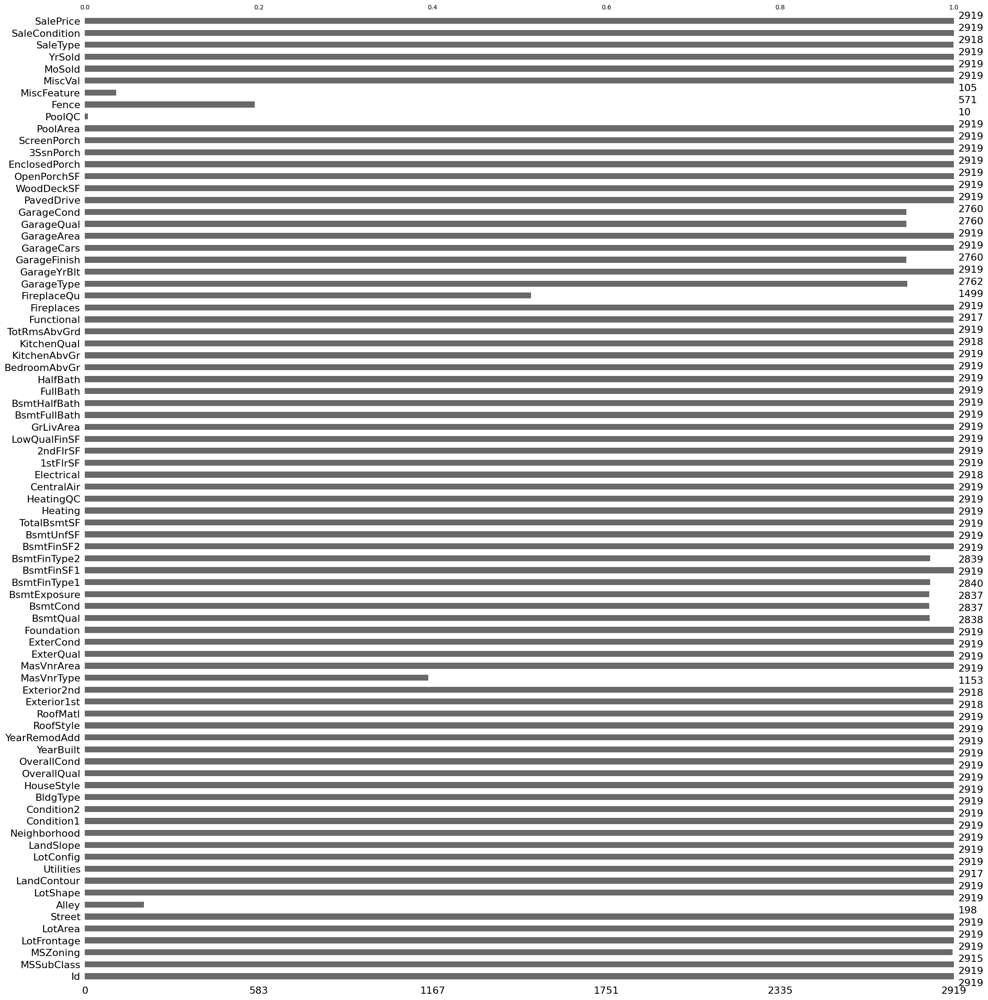

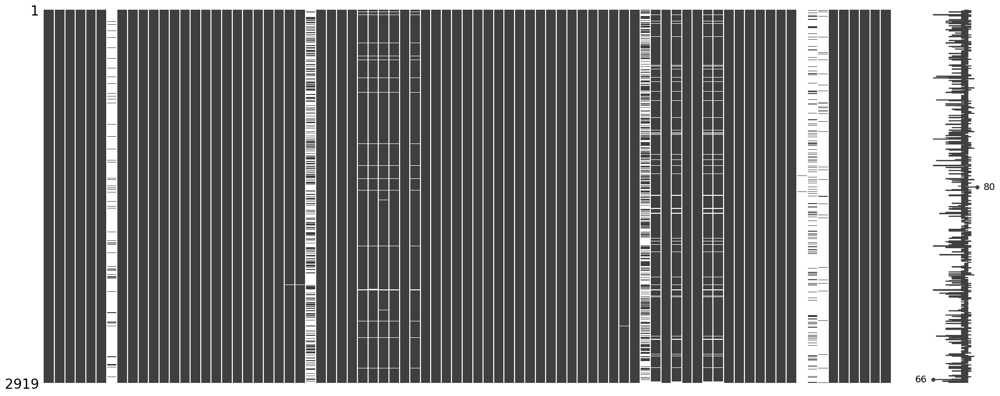

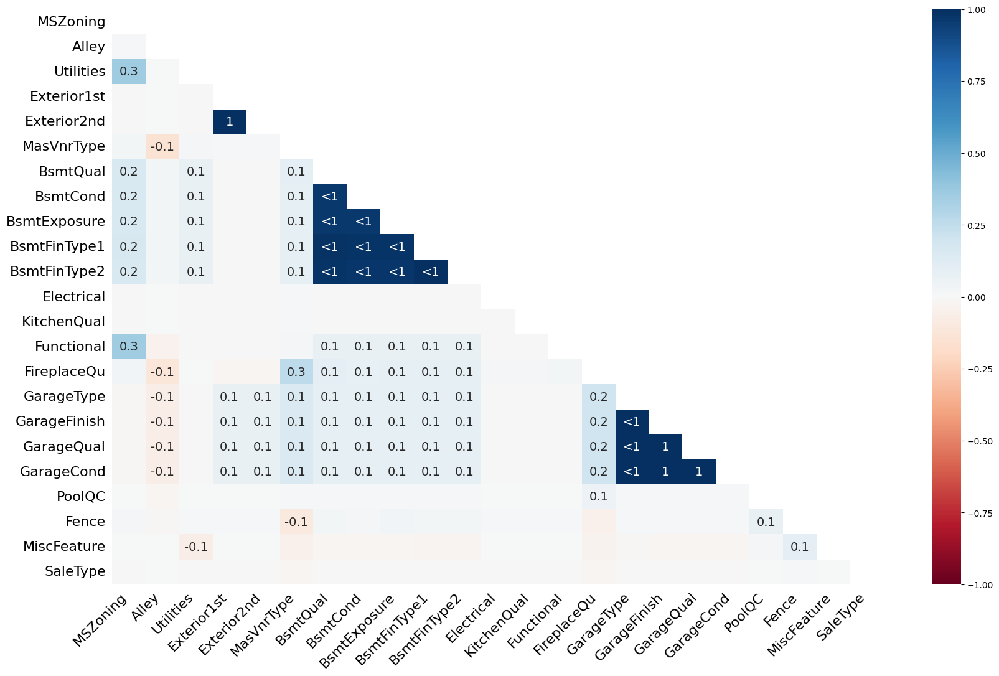

              n_missing  ratio
PoolQC             2909 99.660
MiscFeature        2814 96.400
Alley              2721 93.220
Fence              2348 80.440
MasVnrType         1766 60.500
FireplaceQu        1420 48.650
GarageQual          159  5.450
GarageFinish        159  5.450
GarageCond          159  5.450
GarageType          157  5.380
BsmtCond             82  2.810
BsmtExposure         82  2.810
BsmtQual             81  2.770
BsmtFinType2         80  2.740
BsmtFinType1         79  2.710
MSZoning              4  0.140
Functional            2  0.070
Utilities             2  0.070
Electrical            1  0.030
KitchenQual           1  0.030
Exterior2nd           1  0.030
Exterior1st           1  0.030
SaleType              1  0.030
              n_missing  ratio
PoolQC             2909 99.660
MiscFeature        2814 96.400
Alley              2721 93.220
Fence              2348 80.440
MasVnrType         1766 60.500
FireplaceQu        1420 48.650
GarageQual          159  5.450
GarageFi

In [21]:
df.isnull().sum()

na = [col for col in df.columns if df[col].isnull().sum() > 0]


def missing_values_table(dataframe, na_name=False):
    na_columns = [col for col in dataframe.columns if dataframe[col].isnull().sum() > 0]
    n_missing = dataframe[na_columns].isnull().sum().sort_values(ascending=False)
    ratio = ((dataframe[na_columns].isnull().sum() / dataframe.shape[0]) * 100).sort_values(ascending=False)
    missing_df = pd.concat([n_missing, np.round(ratio, 2)], axis=1, keys=['n_missing', 'ratio'])
    print(missing_df, end="\n")
    if na_name:
        return na_columns


missing_values_table(df, na_name=True)

msno.bar(df)  # Shows the non-null values in the dataset
plt.show()

msno.matrix(df)  # Shows if there's a pattern in the missing values across different variables
plt.show()

msno.heatmap(df)  # Shows the relationship and intensity of missing values with other variables in the dataset
plt.show()

missing_values_table(df, True)  # Displays missing values and their indices
na_cols = missing_values_table(df, True)


def missing_vs_target(dataframe, target, na_columns):
    temp_df = dataframe.copy()

    for col in na_columns:  
        temp_df[col + '_NA_FLAG'] = np.where(temp_df[col].isnull(), 1, 0)  
    na_flags = temp_df.loc[:, temp_df.columns.str.contains("_NA_")].columns

    for col in na_flags:
        print(pd.DataFrame({"TARGET_MEAN": temp_df.groupby(col)[target].mean(),
                            "Count": temp_df.groupby(col)[target].count()}), end="\n\n\n")


missing_vs_target(df, "SalePrice", na_cols)  


### 2.2.1. Filling the NAN-Values

In [22]:
# Replace missing values with 'None' (permanent)
columns_to_fill = ["MiscFeature", "MasVnrType", "GarageFinish", "GarageType", "Alley"]
for col in columns_to_fill:
    df[col].fillna(value="None", inplace=True)

columns_to_fill_zero = ["PoolQC", "FireplaceQu", "GarageCond", "Fence", "KitchenQual", "BsmtFinType1", "BsmtFinType2", "BsmtCond", "BsmtQual", "BsmtExposure", "GarageQual", "GarageCars", "GarageArea"]
for col in columns_to_fill_zero:
    if df[col].dtype == "object":
        df[col].fillna(value="None", inplace=True)
    else:
        df[col].fillna(value=0, inplace=True)

# Fill categorical columns with mode
df = df.apply(lambda x: x.fillna(x.mode()[0]) if (x.dtype == "O" and x.nunique() <= 25) else x, axis=0)

# Fill numerical columns appropriately
numeric_columns = ['LotFrontage', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath']

for col in numeric_columns:
    if df[col].dtype == 'object':
        df[col] = df[col].replace('None', np.nan)  # Replace 'None' values with NaN
    if pd.api.types.is_numeric_dtype(df[col]):
        if 'Int' in str(df[col].dtype):
            df[col] = df[col].astype('float64')  # Convert columns not suitable for Int64 data type to float64
        df[col] = df[col].fillna(df[col].mean())

# Convert MSSubClass column to categorical
df['MSSubClass'] = df['MSSubClass'].astype(str)

print(df.info())  # Print DataFrame info to check for changes

df.isnull().sum()  # Check for missing values


<class 'pandas.core.frame.DataFrame'>
Index: 2919 entries, 0 to 1458
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             2919 non-null   int64  
 1   MSSubClass     2919 non-null   object 
 2   MSZoning       2919 non-null   object 
 3   LotFrontage    2919 non-null   float64
 4   LotArea        2919 non-null   int64  
 5   Street         2919 non-null   object 
 6   Alley          2919 non-null   object 
 7   LotShape       2919 non-null   object 
 8   LandContour    2919 non-null   object 
 9   Utilities      2919 non-null   object 
 10  LotConfig      2919 non-null   object 
 11  LandSlope      2919 non-null   object 
 12  Neighborhood   2919 non-null   object 
 13  Condition1     2919 non-null   object 
 14  Condition2     2919 non-null   object 
 15  BldgType       2919 non-null   object 
 16  HouseStyle     2919 non-null   object 
 17  OverallQual    2919 non-null   int64  
 18  OverallCond  

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr

In [23]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [24]:
missing_values = df.isnull().sum()
print(missing_values[missing_values > 0])

Series([], dtype: int64)


# 3. Feature Engineering


## 3.1. Analyse of the Rare Futures 

In [25]:
def rare_analyser(dataframe, target, cat_cols):
    for col in cat_cols:
        print(col, ":", len(dataframe[col].value_counts()))
        print(pd.DataFrame({"COUNT": dataframe[col].value_counts(),
                            "RATIO": dataframe[col].value_counts() / len(dataframe),
                            "TARGET_MEAN": dataframe.groupby(col)[target].mean()}), end="\n\n\n")

rare_analyser(df, "SalePrice", cat_cols)


MSSubClass : 16
            COUNT  RATIO  TARGET_MEAN
MSSubClass                           
120           182  0.062    95976.813
150             1  0.000        0.000
160           128  0.044    68240.508
180            17  0.006    60176.471
190            61  0.021    63744.262
20           1079  0.370    92011.584
30            139  0.048    47570.151
40              6  0.002   104083.333
45             18  0.006    72394.444
50            287  0.098    71901.143
60            575  0.197   124773.221
70            128  0.044    78174.570
75             23  0.008   133869.565
80            118  0.040    83429.831
85             48  0.016    61587.500
90            109  0.037    63707.670


MSZoning : 5
          COUNT  RATIO  TARGET_MEAN
MSZoning                           
C (all)      25  0.009    29811.200
FV          139  0.048   100078.518
RH           26  0.009    80959.000
RL         2269  0.777    96891.472
RM          460  0.158    59863.193


Street : 2
        COUNT  RATIO

### 3.2. Generating of the new Futures

In [26]:
# Create variables
df['TotalBathrooms'] = df['BsmtFullBath'].astype(float) + df['BsmtHalfBath'].astype(float) + df['FullBath'].astype(float) + df['HalfBath'].astype(float)  # Total number of bathrooms
df['TotalPorchArea'] = df['OpenPorchSF'].astype(float) + df['EnclosedPorch'].astype(float) + df['3SsnPorch'].astype(float) + df['ScreenPorch'].astype(float)  # Total porch area
df['TotalOutdoorSF'] = df['WoodDeckSF'].astype(float) + df['OpenPorchSF'].astype(float) + df['EnclosedPorch'].astype(float) + df['3SsnPorch'].astype(float) + df['ScreenPorch'].astype(float)  # Total outdoor area

# Perform operations on year information in columns

# Calculate age at sale
df['AgeAtSale'] = df['YrSold'] - df['YearBuilt']

# Calculate total area
df['TotalSF'] = df['1stFlrSF'] + df['2ndFlrSF'] + df['TotalBsmtSF']

# Calculate garage age
df['GarageAge'] = df['YrSold'] - df['GarageYrBlt']

# Calculate remodeling or addition age
df['RemodAddAge'] = df['YrSold'] - df['YearRemodAdd']

# Calculate total quality
df['TotalQual'] = df['OverallQual'] + df['OverallCond']

# Calculate total basement bathrooms
df['TotalBsmtBath'] = df['BsmtFullBath'] + df['BsmtHalfBath']

# Calculate total finished basement area
df['TotalBsmtFinSF'] = df['BsmtFinSF1'] + df['BsmtFinSF2']

# Display the dataset
print(df.head(10))

# Create a copy of the DataFrame
new_df = df.copy()



   Id MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape LandContour Utilities  ... TotalBathrooms TotalPorchArea TotalOutdoorSF AgeAtSale  TotalSF GarageAge RemodAddAge  TotalQual  TotalBsmtBath  TotalBsmtFinSF
0   1         60       RL       65.000     8450   Pave  None      Reg         Lvl    AllPub  ...          4.000         61.000         61.000         5 2566.000         5           5         12          1.000         706.000
1   2         20       RL       80.000     9600   Pave  None      Reg         Lvl    AllPub  ...          3.000          0.000        298.000        31 2524.000        31          31         14          1.000         978.000
2   3         60       RL       68.000    11250   Pave  None      IR1         Lvl    AllPub  ...          4.000         42.000         42.000         7 2706.000         7           6         12          1.000         486.000
3   4         70       RL       60.000     9550   Pave  None      IR1         Lvl    AllPub  ...    

In [27]:
new_df=df.copy()
new_df.shape

(2919, 91)

## 3.3. Future Encoding

In [28]:
# Step 4: Perform Encoding Operations

# Define a function to encode rare categories
def rare_encoder(dataframe, rare_perc):
    """
    Encodes rare categories in categorical variables.

    Parameters:
    dataframe (DataFrame): Dataset.
    rare_perc (float): Threshold to consider a category as rare.

    Returns:
    DataFrame: Dataset with rare categories encoded.
    """
    temp_df = dataframe.copy()
    rare_columns = [col for col in temp_df.columns if temp_df[col].dtypes == 'O'
                    and (temp_df[col].value_counts() / len(temp_df) < rare_perc).any(axis=None)]

    for var in rare_columns:
        tmp = temp_df[var].value_counts() / len(temp_df)
        rare_labels = tmp[tmp < rare_perc].index
        temp_df[var] = np.where(temp_df[var].isin(rare_labels), 'Rare', temp_df[var])

    return temp_df

# Encode rare categories in the dataset
new_df_rare = rare_encoder(new_df, 0.01)

# Define a function to perform label encoding on binary variables
def label_encoder(dataframe, binary_col):
    """
    Performs label encoding on binary variables.

    Parameters:
    dataframe (DataFrame): Dataset.
    binary_col (str): Name of the binary column to be label encoded.

    Returns:
    DataFrame: Dataset with binary column label encoded.
    """
    labelencoder = LabelEncoder()
    dataframe[binary_col] = labelencoder.fit_transform(dataframe[binary_col])
    return dataframe

# Identify binary columns in the dataset
binary_cols = [col for col in new_df.columns if new_df[col].dtype not in [int, float]
               and new_df[col].nunique() == 2]

# Perform label encoding on binary columns
new_df_binary_label_encoded = new_df_rare.copy()
label_encoder = LabelEncoder()
for col in binary_cols:
    new_df_binary_label_encoded[col] = label_encoder.fit_transform(new_df_binary_label_encoded[col])

# Define a function to perform one-hot encoding
def one_hot_encoder(dataframe, categorical_cols, drop_first=True):
    """
    Performs one-hot encoding on categorical columns.

    Parameters:
    dataframe (DataFrame): Dataset.
    categorical_cols (list): List of categorical columns to be one-hot encoded.
    drop_first (bool): Whether to drop the first column after encoding.

    Returns:
    DataFrame: Dataset with categorical columns one-hot encoded.
    """
    dataframe = pd.get_dummies(dataframe, columns=categorical_cols, drop_first=drop_first)
    return dataframe

# Identify columns suitable for one-hot encoding
ohe_cols = [col for col in new_df.columns if 30 >= new_df[col].nunique() > 2]

# Perform one-hot encoding
new_df_one_hot_encoded = one_hot_encoder(new_df_binary_label_encoded, ohe_cols)

# Define a function to perform label encoding on boolean categorical variables
def label_encode_categorical(df):
    """
    Performs label encoding on boolean type categorical columns.

    Parameters:
    df (DataFrame): Dataset.

    Returns:
    DataFrame: Dataset with boolean type categorical columns label encoded.
    """
    label_encoder = LabelEncoder()
    for col in df.columns:
        if df[col].dtype == 'bool':
            df[col] = label_encoder.fit_transform(df[col])
    return df

# Perform label encoding on boolean type categorical columns
new_df_final = label_encode_categorical(new_df_one_hot_encoded)

# Display the data types of the final dataset
new_df_final.dtypes

# Display the first few rows of the final dataset
new_df_final.head()

# Display the shape of the final dataset
new_df_final.shape



(2919, 309)

## 3.4. Future Scaling

In [29]:
# Min-Max Scaling

# Select numeric columns excluding 'SalePrice'
numeric_columns_new_df = new_df.select_dtypes(include=['int', 'float']).columns.drop('SalePrice')

# Min-Max Scaling
scaler_minmax = MinMaxScaler()
new_df_final[numeric_columns_new_df] = scaler_minmax.fit_transform(new_df[numeric_columns_new_df])

# Check the shape of the dataframe
print(new_df_final.shape)  # (2919, 410)

# Display the columns of the dataframe
print(new_df_final.columns)

# Display the first few rows of the dataframe
print(new_df_final.head())


(2919, 324)
Index(['Id', 'LotFrontage', 'LotArea', 'Street', 'Utilities', 'YearBuilt',
       'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       ...
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageCars', 'YrSold', 'TotalBathrooms', 'TotalQual',
       'TotalBsmtBath'],
      dtype='object', length=324)
     Id  LotFrontage  LotArea  Street  Utilities  YearBuilt  YearRemodAdd  MasVnrArea  BsmtFinSF1  BsmtFinSF2  ...  HalfBath  BedroomAbvGr  KitchenAbvGr  TotRmsAbvGrd  Fireplaces  GarageCars  YrSold  TotalBathrooms  TotalQual  TotalBsmtBath
0 0.000        0.208    0.194       0          0      0.949         0.883       0.122       0.125       0.000  ...     0.500         0.375         0.333         0.462       0.000       0.400   0.500           0.429      0.588          0.333
1 0.000        0.256    0.226       0          0      0.754         0.433       0.000       0.173       0.000  ...     0.000         0.375         0.333 

# 4. Modelbuilding

In [30]:

# Train set: Observations with non-null values in the 'SalePrice' column
train_set = new_df_final.iloc[:1460]
test_set=new_df_final.iloc[1460:]

# Keep all other columns in the train set
X = train_set.drop(columns=["SalePrice"])
# Apply logarithmic transformation to the 'SalePrice' variable
y = np.log1p(train_set['SalePrice'])

X = train_set.drop(["SalePrice"], axis=1)

# Apply logarithmic transformation to the 'SalePrice' variable
y = np.log1p(train_set['SalePrice'])

# Keep the remaining columns from the original dataset in the test set
X_test = test_set.drop(columns=["SalePrice"])


## 4.1. Base Models

In [31]:
# Identify dependent and independent variables
X = train_set.drop(["SalePrice"], axis=1)
y = np.log1p(train_set['SalePrice'])

# Train-test split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Define base models
base_rf_model = RandomForestRegressor(random_state=42)
base_xgb_model = XGBRegressor(random_state=42, verbosity=0)
base_lgbm_model = LGBMRegressor(random_state=42)
base_catboost_model = CatBoostRegressor(random_state=42, verbose=0)





## 4.2. Hyperparameter Optimization

In [32]:
# Define parameter grids for hyperparameter tuning
rf_param_grid = {"n_estimators": [100, 300, 500],
                 "max_depth": [None, 5, 10],
                 "min_samples_split": [2, 5, 10],
                 "min_samples_leaf": [1, 2, 4]}

xgb_param_grid = {"n_estimators": [100, 300, 500],
                  "learning_rate": [0.01, 0.1, 0.3],
                  "max_depth": [3, 5, 7]}

lgbm_param_grid = {"n_estimators": [100, 300, 500],
                   "learning_rate": [0.01, 0.1, 0.3],
                   "max_depth": [3, 5, 7],
                   "num_leaves": [20, 30, 40]}

catboost_param_grid = {'iterations': [100, 300, 500],
                       'learning_rate': [0.01, 0.1, 0.3],
                       'depth': [4, 6, 8]}

# Grid search for hyperparameter tuning
# Grid search for hyperparameter tuning
grid_search_rf = GridSearchCV(base_rf_model, rf_param_grid, cv=5, n_jobs=-1, verbose=1)
grid_search_rf.fit(X_train, y_train)

grid_search_xgb = GridSearchCV(base_xgb_model, xgb_param_grid, cv=5, n_jobs=-1, verbose=1)
grid_search_xgb.fit(X_train, y_train)

grid_search_lgbm = GridSearchCV(base_lgbm_model, lgbm_param_grid, cv=5, n_jobs=-1, verbose=1)
grid_search_lgbm.fit(X_train, y_train)

grid_search_catboost = GridSearchCV(base_catboost_model, catboost_param_grid, cv=5, n_jobs=-1, verbose=1)
grid_search_catboost.fit(X_train, y_train)



Fitting 5 folds for each of 81 candidates, totalling 405 fits
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Fitting 5 folds for each of 81 candidates, totalling 405 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008199 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4412
[LightGBM] [Info] Number of data points in the train set: 934, number of used features: 231
[LightGBM] [Info] Start training from score 12.041228
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Tota

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostRegressor object at 0x7cc1ee43e470>,
             n_jobs=-1,
             param_grid={'depth': [4, 6, 8], 'iterations': [100, 300, 500],
                         'learning_rate': [0.01, 0.1, 0.3]},
             verbose=1)

In [33]:
print("Best Parameters for RandomForest:", grid_search_rf.best_params_)
print("Best Performance Score for RandomForest:", grid_search_rf.best_score_)

print("Best Parameters for XGBoost:", grid_search_xgb.best_params_)
print("Best Performance Score for XGBoost:", grid_search_xgb.best_score_)

print("Best Parameters for LightGBM:", grid_search_lgbm.best_params_)
print("Best Performance Score for LightGBM:", grid_search_lgbm.best_score_)

print("Best Parameters for CatBoost:", grid_search_catboost.best_params_)
print("Best Performance Score for CatBoost:", grid_search_catboost.best_score_)


Best Parameters for RandomForest: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 500}
Best Performance Score for RandomForest: 0.8699516691055397
Best Parameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 300}
Best Performance Score for XGBoost: 0.8963099029015431
Best Parameters for LightGBM: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500, 'num_leaves': 20}
Best Performance Score for LightGBM: 0.8951830523739404
Best Parameters for CatBoost: {'depth': 4, 'iterations': 500, 'learning_rate': 0.1}
Best Performance Score for CatBoost: 0.8987242140108526


In [34]:
# Best parameters after hyperparameter tuning
best_rf_params = grid_search_rf.best_params_
best_xgb_params = grid_search_xgb.best_params_
best_lgbm_params = grid_search_lgbm.best_params_
best_catboost_params = grid_search_catboost.best_params_

# Initialize models with best parameters
best_rf_model = RandomForestRegressor(**best_rf_params, random_state=42)
best_xgb_model = XGBRegressor(**best_xgb_params, random_state=42, verbosity=0)
best_lgbm_model = LGBMRegressor(**best_lgbm_params, random_state=42)
best_catboost_model = CatBoostRegressor(**best_catboost_params, random_state=42, verbose=0)



## 4.3. Results

In [35]:
from sklearn.metrics import mean_squared_error

# Fit the models on the training data
best_rf_model.fit(X_train, y_train)
best_xgb_model.fit(X_train, y_train)
best_lgbm_model.fit(X_train, y_train)
best_catboost_model.fit(X_train, y_train)

# Make predictions on validation set
rf_predictions = best_rf_model.predict(X_val)
xgb_predictions = best_xgb_model.predict(X_val)
lgbm_predictions = best_lgbm_model.predict(X_val)
catboost_predictions = best_catboost_model.predict(X_val)

# Compare predictions with actual y values
rf_mse = mean_squared_error(y_val, rf_predictions)
xgb_mse = mean_squared_error(y_val, xgb_predictions)
lgbm_mse = mean_squared_error(y_val, lgbm_predictions)
catboost_mse = mean_squared_error(y_val, catboost_predictions)

# Display results in a DataFrame
results_df = pd.DataFrame({'Model': ['Random Forest', 'XGBoost', 'LightGBM', 'CatBoost'],
                           'Mean Squared Error': [rf_mse, xgb_mse, lgbm_mse, catboost_mse]})
print(results_df)
from sklearn.metrics import mean_squared_error

# Fit the models on the training data
best_rf_model.fit(X_train, y_train)
best_xgb_model.fit(X_train, y_train)
best_lgbm_model.fit(X_train, y_train)
best_catboost_model.fit(X_train, y_train)

# Make predictions on validation set
rf_predictions = best_rf_model.predict(X_val)
xgb_predictions = best_xgb_model.predict(X_val)
lgbm_predictions = best_lgbm_model.predict(X_val)
catboost_predictions = best_catboost_model.predict(X_val)

# Compare predictions with actual y values
rf_mse = mean_squared_error(y_val, rf_predictions)
xgb_mse = mean_squared_error(y_val, xgb_predictions)
lgbm_mse = mean_squared_error(y_val, lgbm_predictions)
catboost_mse = mean_squared_error(y_val, catboost_predictions)

# Display results in a DataFrame
results_df = pd.DataFrame({'Model': ['Random Forest', 'XGBoost', 'LightGBM', 'CatBoost'],
                           'Mean Squared Error': [rf_mse, xgb_mse, lgbm_mse, catboost_mse]})
print(results_df)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001589 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4795
[LightGBM] [Info] Number of data points in the train set: 1168, number of used features: 246
[LightGBM] [Info] Start training from score 12.030658
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

# 6. Prediction

In [36]:
test_set=new_df_final.iloc[1460:]
X_test = test_set.drop(columns=["SalePrice"])
test_set.head()

# Make predictions on the test set

rf_test_predictions = best_rf_model.predict(X_test)
xgb_test_predictions = best_xgb_model.predict(X_test)
lgbm_test_predictions = best_lgbm_model.predict(X_test)
catboost_test_predictions = best_catboost_model.predict(X_test)

# Compare predictions with actual y values in the test set

"""
# (Assuming test_set contains the true SalePrice values for the test set)
rf_test_mse = mean_squared_error(test_set['SalePrice'], rf_test_predictions)
xgb_test_mse = mean_squared_error(test_set['SalePrice'], xgb_test_predictions)
lgbm_test_mse = mean_squared_error(test_set['SalePrice'], lgbm_test_predictions)
catboost_test_mse = mean_squared_error(test_set['SalePrice'], catboost_test_predictions)

# Display test set results in the DataFrame
test_results_df = pd.DataFrame({'Model': ['Random Forest', 'XGBoost', 'LightGBM', 'CatBoost'],
                                'Test Mean Squared Error': [rf_test_mse, xgb_test_mse, lgbm_test_mse, catboost_test_mse]})
print(test_results_df)

"""


"\n# (Assuming test_set contains the true SalePrice values for the test set)\nrf_test_mse = mean_squared_error(test_set['SalePrice'], rf_test_predictions)\nxgb_test_mse = mean_squared_error(test_set['SalePrice'], xgb_test_predictions)\nlgbm_test_mse = mean_squared_error(test_set['SalePrice'], lgbm_test_predictions)\ncatboost_test_mse = mean_squared_error(test_set['SalePrice'], catboost_test_predictions)\n\n# Display test set results in the DataFrame\ntest_results_df = pd.DataFrame({'Model': ['Random Forest', 'XGBoost', 'LightGBM', 'CatBoost'],\n                                'Test Mean Squared Error': [rf_test_mse, xgb_test_mse, lgbm_test_mse, catboost_test_mse]})\nprint(test_results_df)\n\n"

In [37]:

# Reverting from logarithmic transformation to original values and showing them
print(np.exp(rf_test_predictions))

[123787.25231447 155487.46476393 169116.3506664  ... 161339.4771407
 117465.47134637 223670.08992699]


In [38]:
print(np.exp(xgb_test_predictions))


[121824.96 167175.12 186342.12 ... 158752.02 121805.2  221993.38]


In [39]:
print(np.exp(lgbm_test_predictions))


[124836.53476961 163652.80275599 184090.12696258 ... 167300.21822571
 126102.09247761 214227.51195918]


In [40]:
print(np.exp(catboost_test_predictions))

[124999.18119759 163922.1753094  191781.63817282 ... 169518.30872192
 114096.79057096 239238.76751407]


# 5. Future Importance

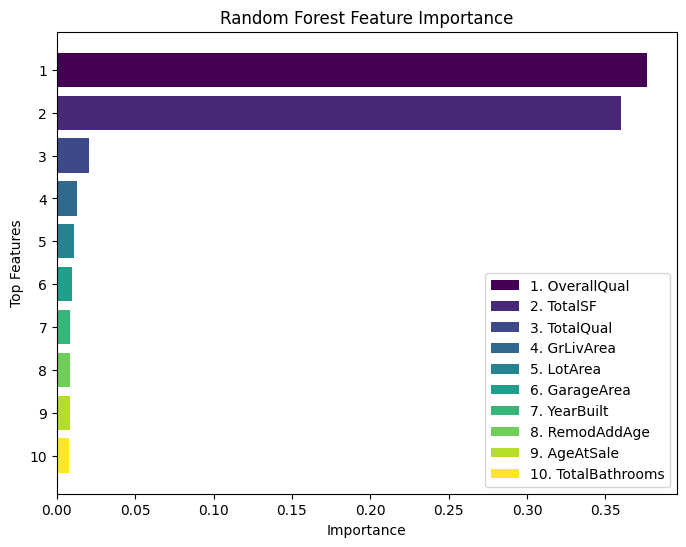

            Feature  Importance
308     OverallQual       0.377
29          TotalSF       0.360
321       TotalQual       0.021
16        GrLivArea       0.013
2           LotArea       0.011
18       GarageArea       0.010
5         YearBuilt       0.008
31      RemodAddAge       0.008
28        AgeAtSale       0.008
320  TotalBathrooms       0.008


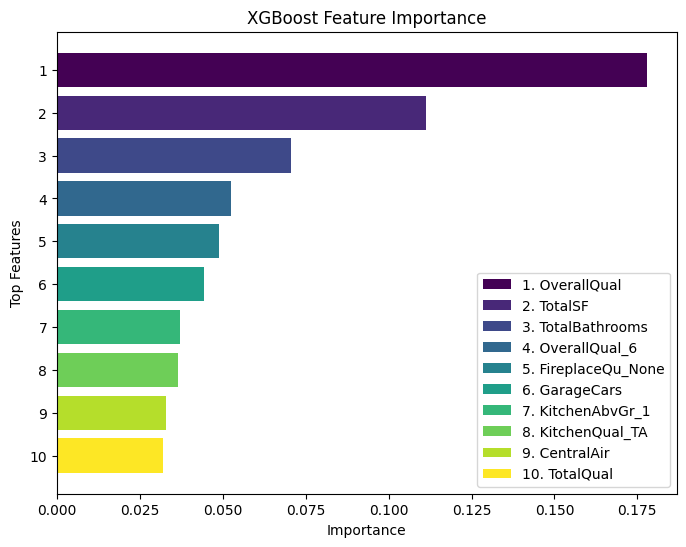

              Feature  Importance
308       OverallQual       0.178
29            TotalSF       0.111
320    TotalBathrooms       0.070
101     OverallQual_6       0.052
230  FireplaceQu_None       0.049
318        GarageCars       0.044
200    KitchenAbvGr_1       0.037
206    KitchenQual_TA       0.037
12         CentralAir       0.033
321         TotalQual       0.032


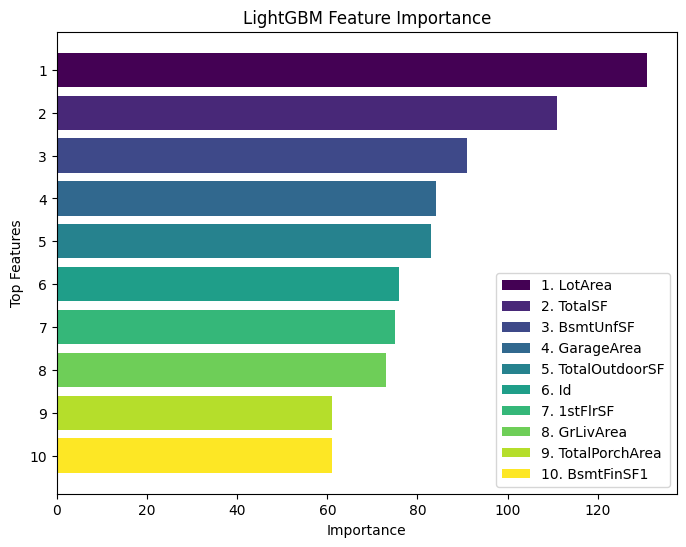

           Feature  Importance
2          LotArea         131
29         TotalSF         111
10       BsmtUnfSF          91
18      GarageArea          84
27  TotalOutdoorSF          83
0               Id          76
13        1stFlrSF          75
16       GrLivArea          73
26  TotalPorchArea          61
8       BsmtFinSF1          61


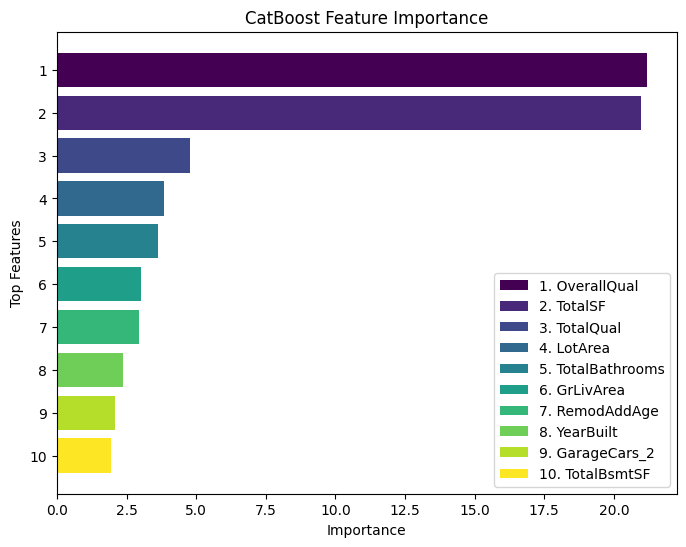

            Feature  Importance
308     OverallQual      21.205
29          TotalSF      20.975
321       TotalQual       4.779
2           LotArea       3.862
320  TotalBathrooms       3.623
16        GrLivArea       3.007
31      RemodAddAge       2.956
5         YearBuilt       2.370
242    GarageCars_2       2.104
11      TotalBsmtSF       1.939


In [41]:
rf_feature_importance = best_rf_model.feature_importances_
xgb_feature_importance = best_xgb_model.feature_importances_
lgbm_feature_importance = best_lgbm_model.feature_importances_
catboost_feature_importance = best_catboost_model.feature_importances_


def plot_feature_importance(feature_importance, feature_names, model_name, top_n=10):
	# Create DataFrame to store feature importance values
	importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})
	# Sort values by importance in descending order
	importance_df = importance_df.sort_values(by='Importance', ascending=False).head(top_n)
	
	# Define colors for each feature
	colors = plt.cm.viridis(np.linspace(0, 1, len(importance_df)))
	
	# Plot feature importance
	plt.figure(figsize=(8, 6))
	bars = plt.barh(range(len(importance_df)), importance_df['Importance'], color=colors)
	plt.title(f'{model_name} Feature Importance')
	plt.xlabel('Importance')
	plt.ylabel('Top Features')
	plt.gca().invert_yaxis()  # Invert y-axis to show most important features at the top
	plt.yticks(range(len(importance_df)), range(1, len(importance_df) + 1))  # Set y-ticks as numbers
	
	# Add legend with feature names and colors
	legend_labels = [f'{i + 1}. {importance_df.iloc[i]["Feature"]}' for i in range(len(importance_df))]
	plt.legend(bars, legend_labels, loc='lower right')
	
	plt.show()
	
	# Display feature importance values
	print(importance_df)


# Example usage:
plot_feature_importance(rf_feature_importance, X_train.columns, 'Random Forest', top_n=10)
plot_feature_importance(xgb_feature_importance, X_train.columns, 'XGBoost', top_n=10)
plot_feature_importance(lgbm_feature_importance, X_train.columns, 'LightGBM', top_n=10)
plot_feature_importance(catboost_feature_importance, X_train.columns, 'CatBoost', top_n=10)



# 7. Save Output

In [42]:
# pip install openpyxl

# Create a DataFrame for predictions
data = {
    "Id": test_set.index,  # Use indices as the 'Id' column
    "Random Forest Predictions": np.exp(rf_test_predictions),
    "XGBoost Predictions": np.exp(xgb_test_predictions),
    "LightGBM Predictions": np.exp(lgbm_test_predictions),
    "CatBoost Predictions": np.exp(catboost_test_predictions)
}

df_output = pd.DataFrame(data)

# Write the DataFrame to an Excel file
# Use index=False to exclude indices from being written to the file
df_output.to_excel("model_predictions.xlsx", index=False)
